In [1]:
from dask.distributed import Client

client = Client("tcp://127.0.0.1:33649")
client

<Client: 'tcp://127.0.0.1:33649' processes=8 threads=32, memory=125.85 GiB>

In [2]:
import numpy as np
import xarray as xr
import pandas as pd
import os.path as op
import os
import gsw
import xrft
import xwavelet
from scipy.interpolate import griddata
from scipy.stats import bootstrap
from xgcm.grid import Grid
import MITgcmutils as mitutils
from xmitgcm import open_mdsdataset
# from fastjmd95 import rho as densjmd95
import matplotlib.colors as clr
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
ddir = '/tank/chaocean/qjamet/RUNS/ORAR/reruns2/'
gdir = '/tank/chaocean/grid_chaO/gridMIT_update1/'
savedir = '/tank/topog/tuchida/Wavelet-spectrum/'
spec = '/tank/spectre/tuchida/NA-wavelets/'
diag = '/tank/spectre/tuchida/diagnostics/'

In [4]:
grav = 9.81
nensembs = 5
Kh = 20.
K4 = 1e10
Kr = 1e-5
thetaMax = 1e20
rhoConst = 9.998e2
# Cp = 3.994e3
Cp = 3989.244953
# years = np.arange(2008,2013,dtype=int)
ySstart = -15
yNstart = 15
yend = 50
dnf = 2160
nfile = 73

In [5]:
xs = [295,318,
      297.5,316,
      300,315
     ]
ys = [37,43,
      30.5,30,
      24,22
     ]
reg = 0
sreg = ['A','B','C','D','E','F']

xo = 50e3

nmembs = np.arange(100,148)
xchunk = 200
ychunk = 200
Zs = [0,18]

In [6]:
years = np.arange(1967,1968,dtype=int)
ntimes = np.arange(1419120,1574640+dnf,dnf).reshape(len(years),nfile)
dd = 3  # 

print(ntimes[0,dd:][::3])

[1425600 1432080 1438560 1445040 1451520 1458000 1464480 1470960 1477440
 1483920 1490400 1496880 1503360 1509840 1516320 1522800 1529280 1535760
 1542240 1548720 1555200 1561680 1568160 1574640]


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


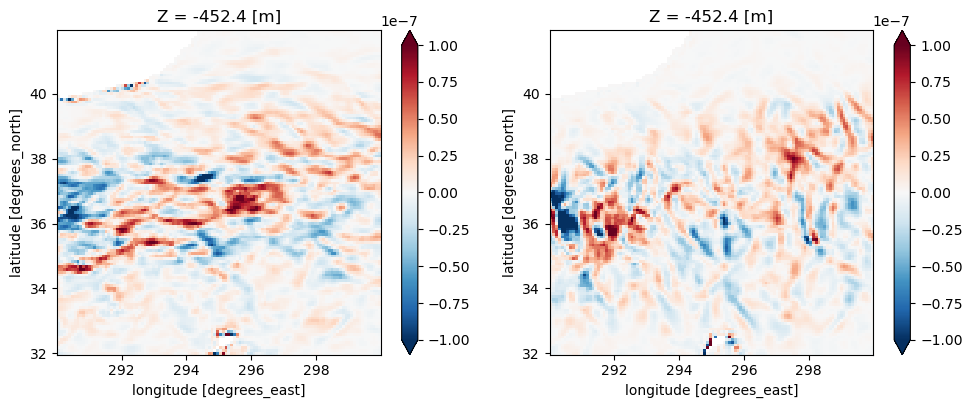

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1425600


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


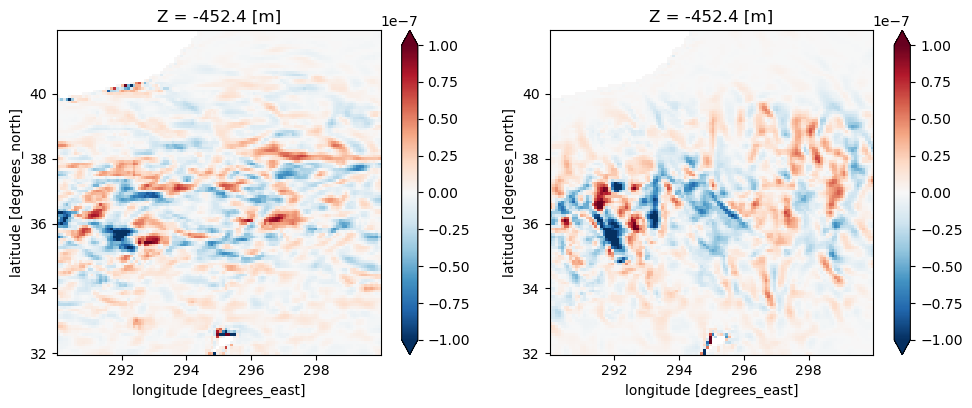

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1427760


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


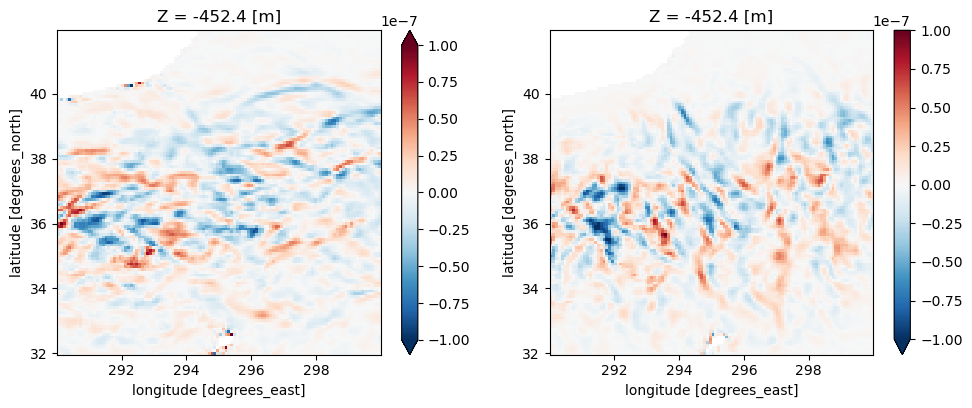

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1429920


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


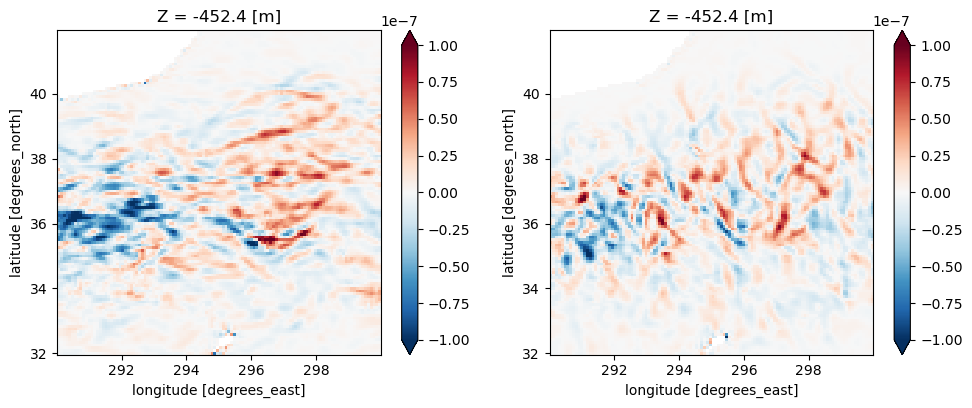

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1432080


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


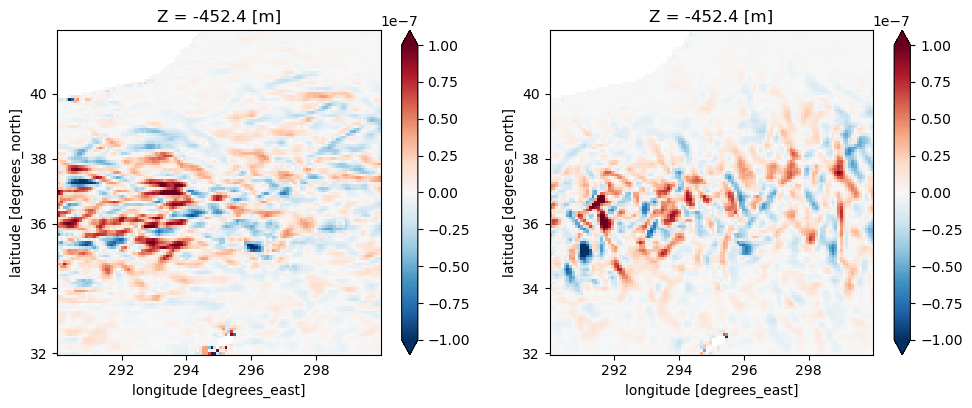

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1434240


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


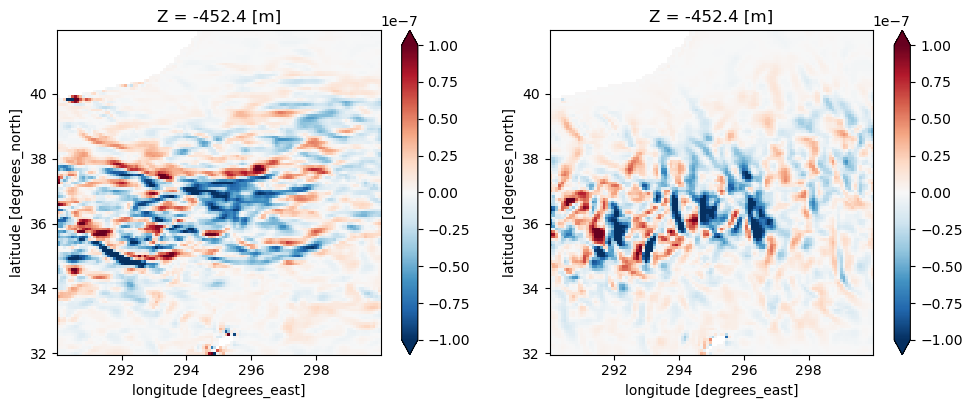

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1436400


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


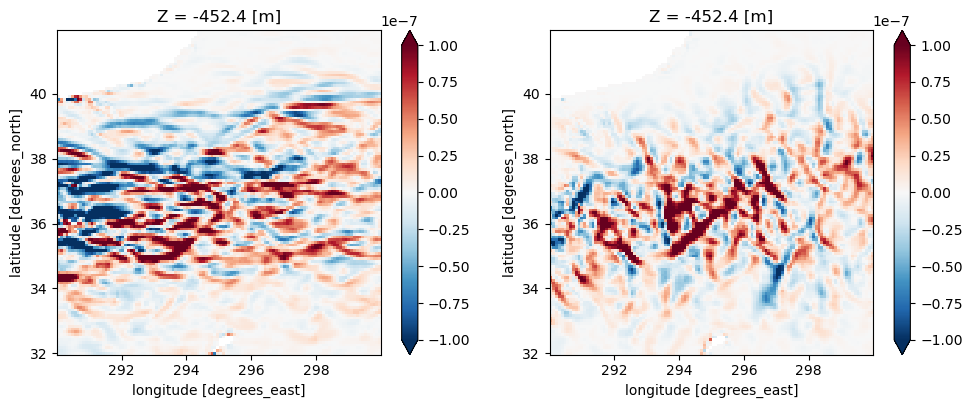

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1438560


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


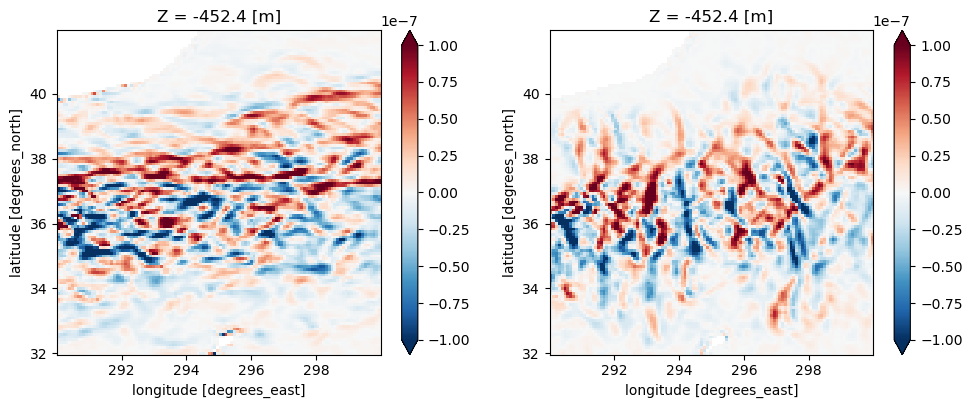

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1440720


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


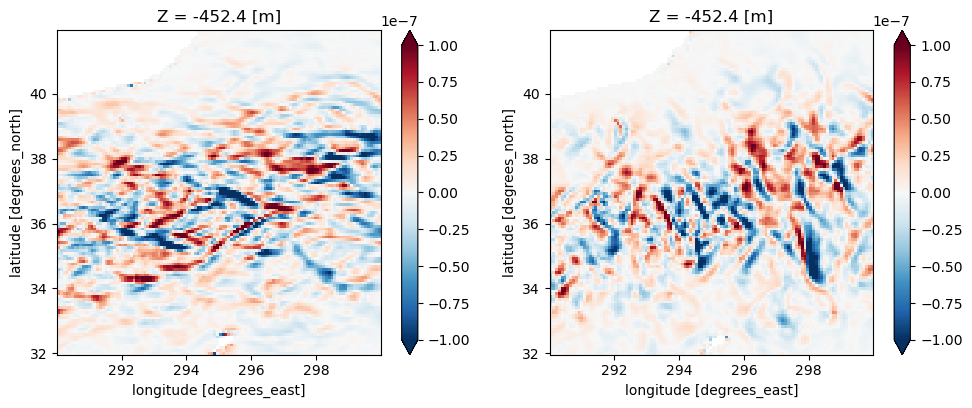

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1442880


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


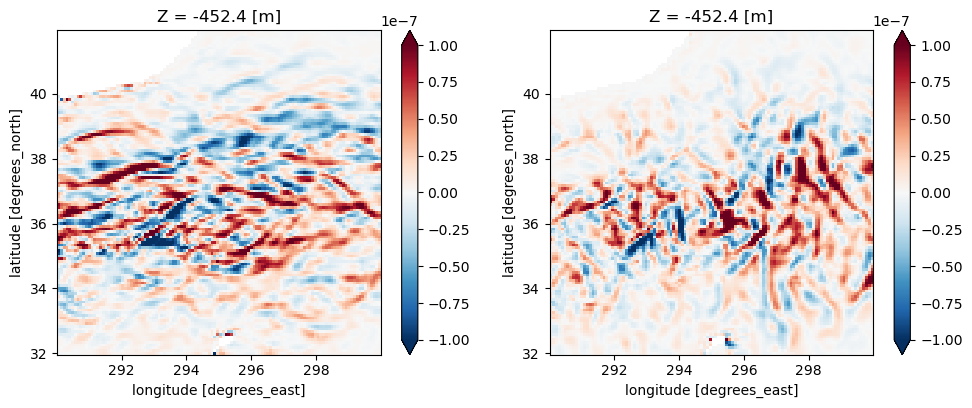

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1445040


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


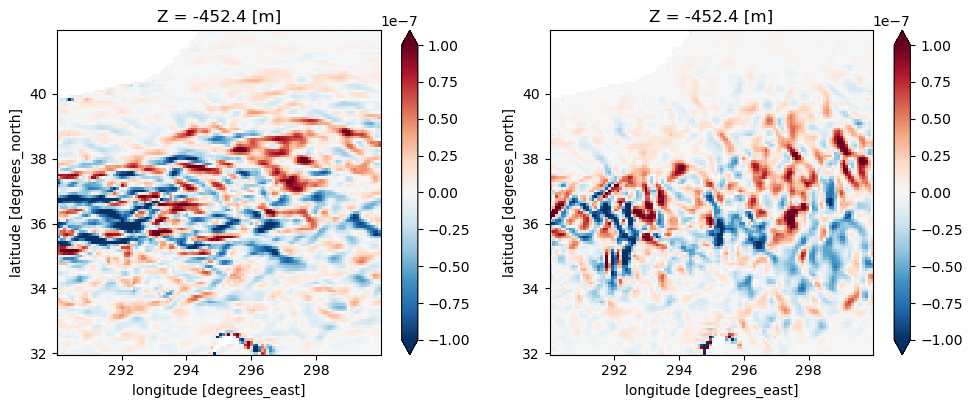

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1447200


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


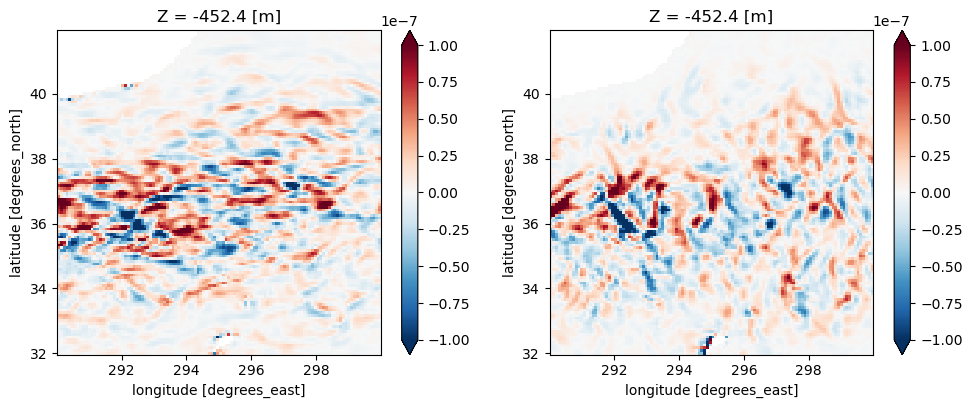

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1449360


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


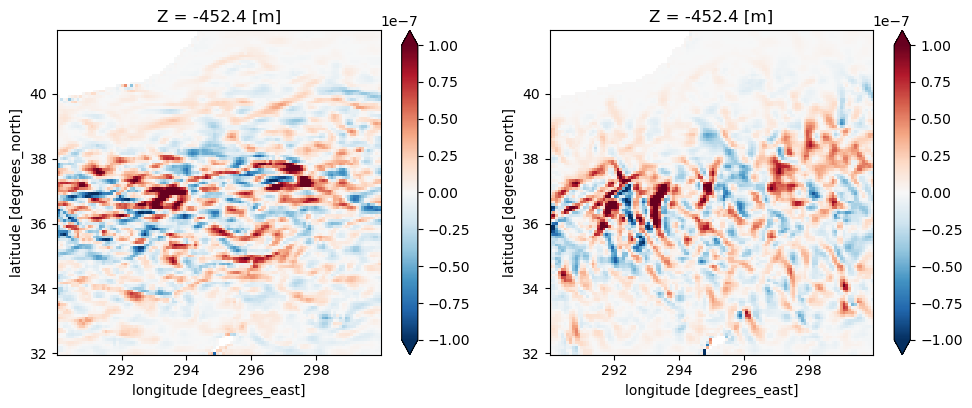

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1451520


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


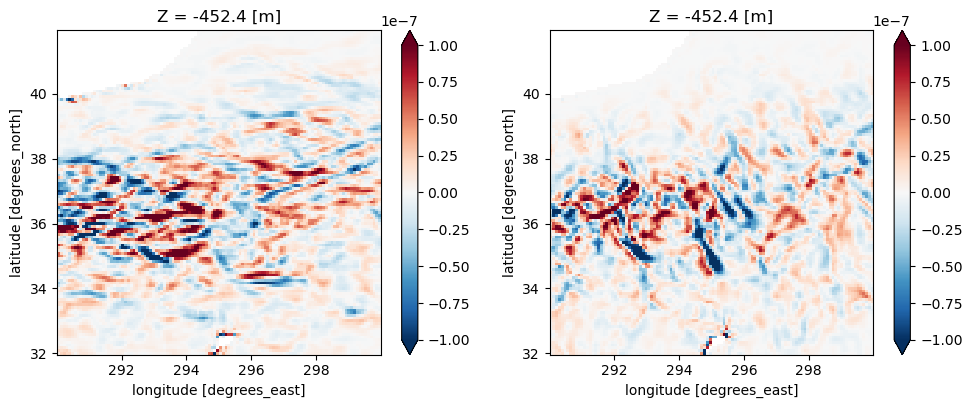

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1453680


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


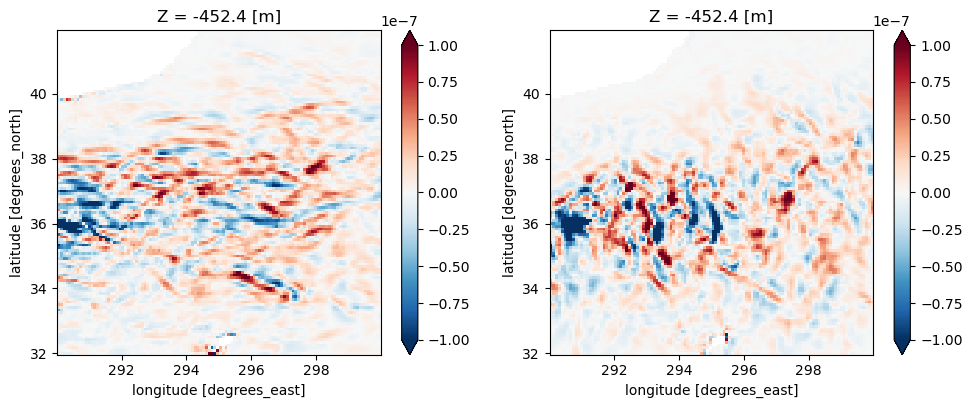

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1455840


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


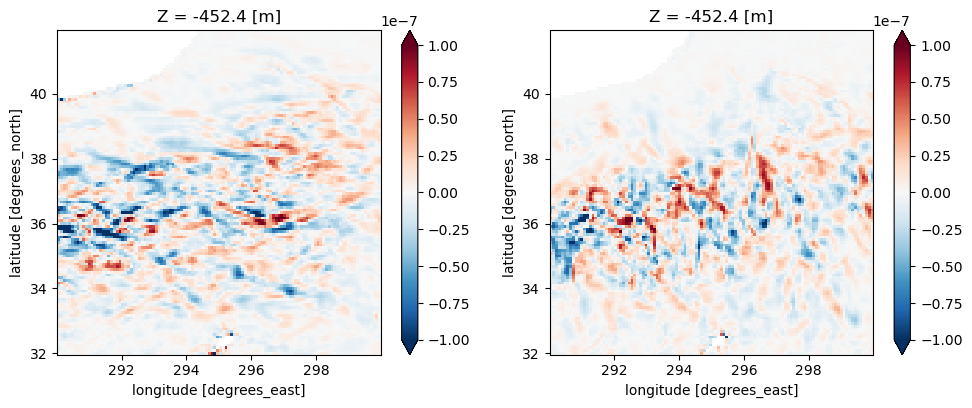

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1458000


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


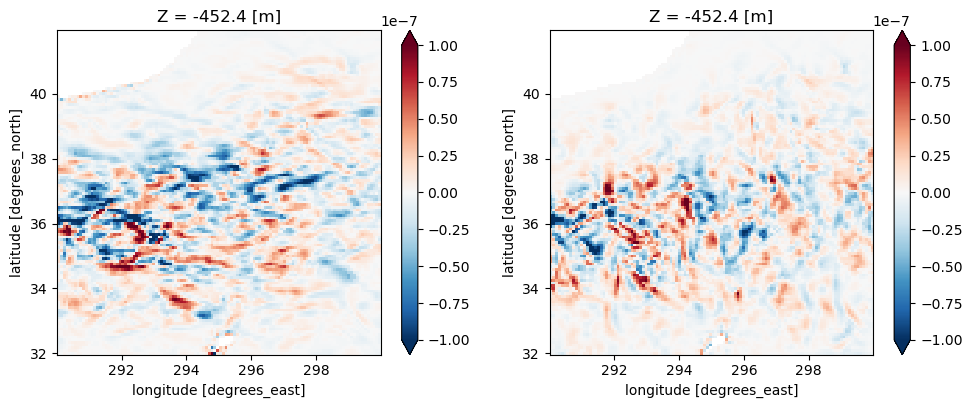

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1460160


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


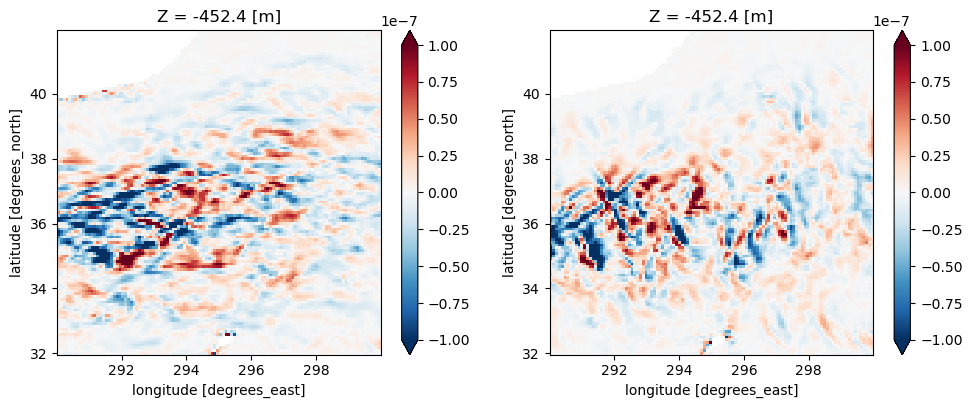

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1462320


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


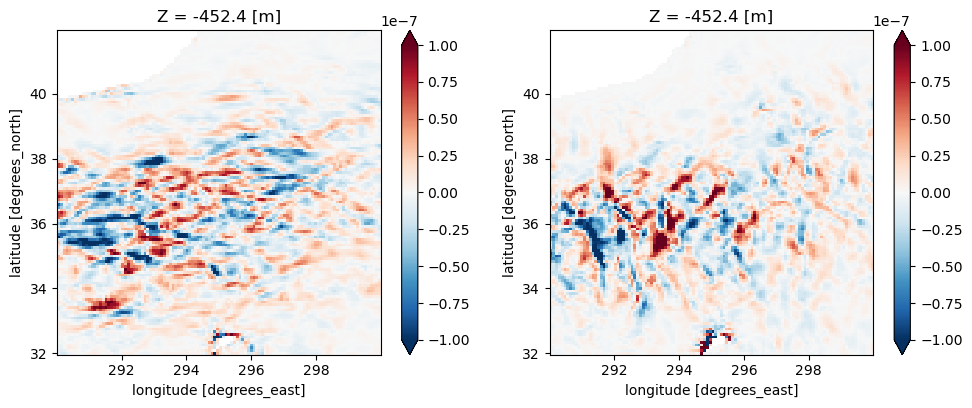

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1464480


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


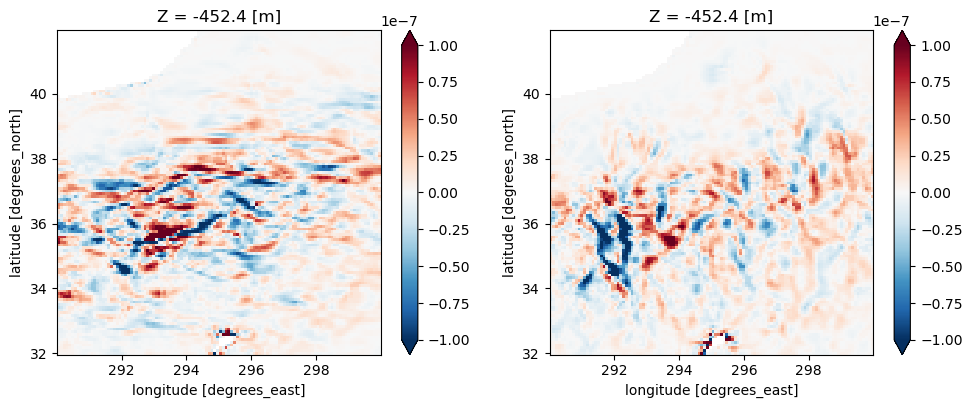

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1466640


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


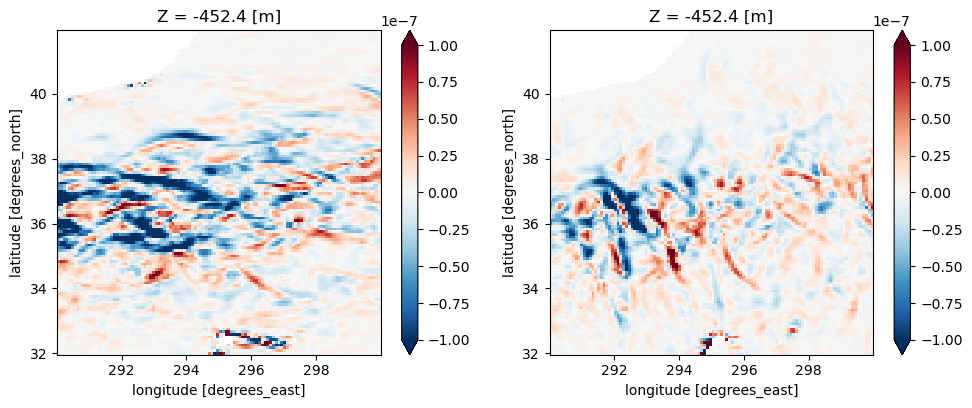

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1468800


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


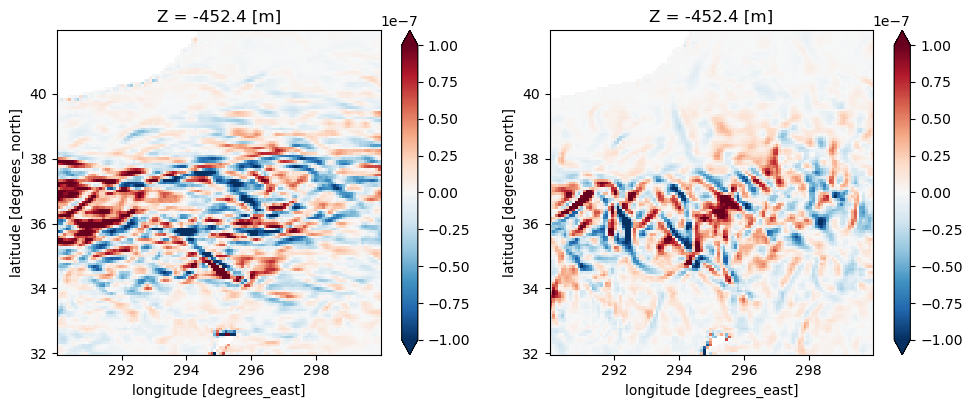

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1470960


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


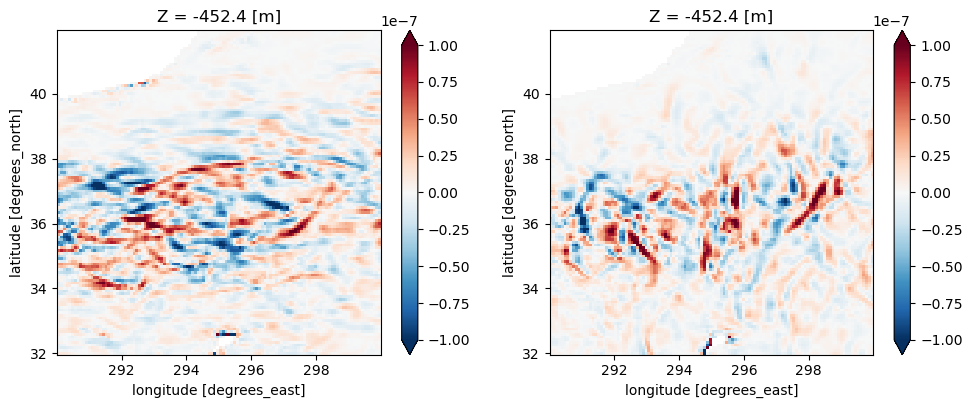

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1473120


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


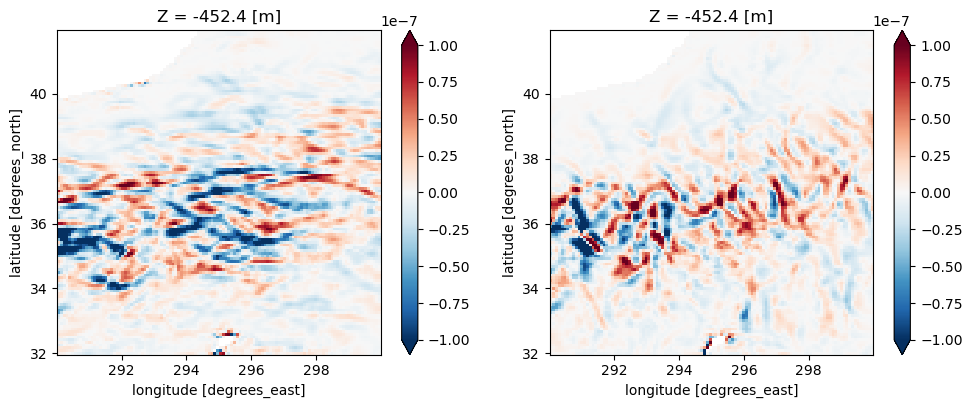

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1475280


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


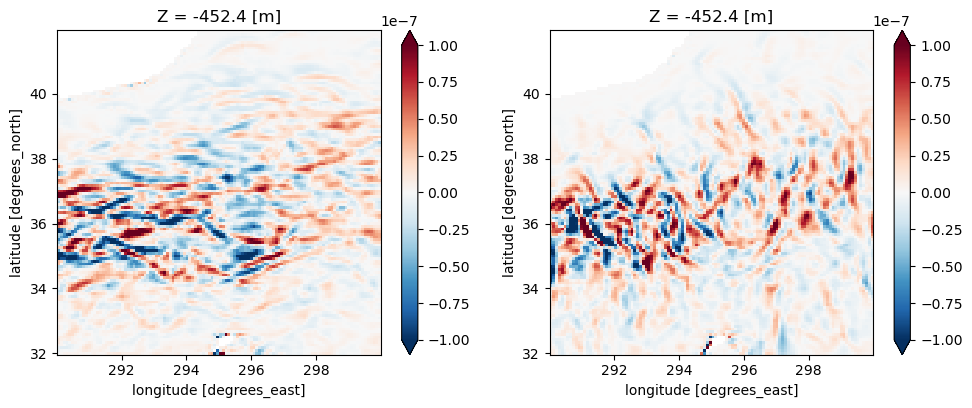

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1477440


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


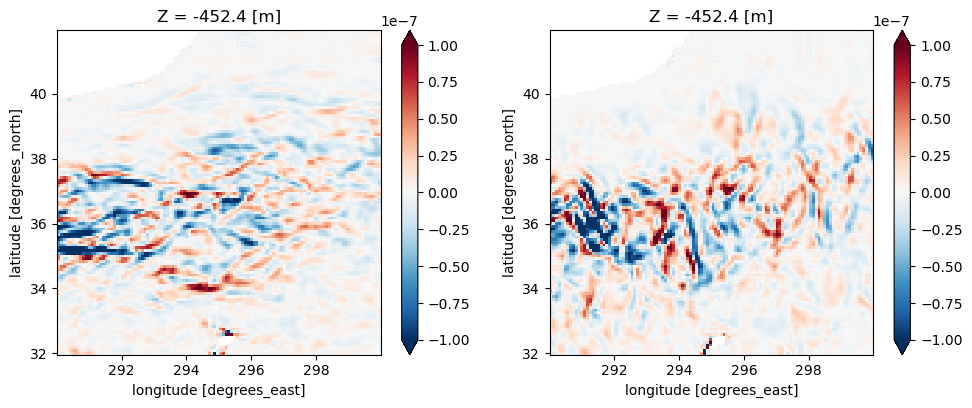

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1479600


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


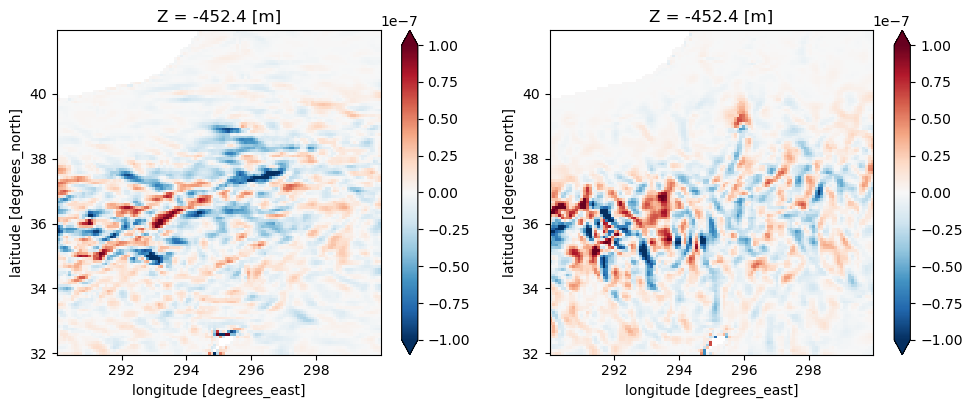

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1481760


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


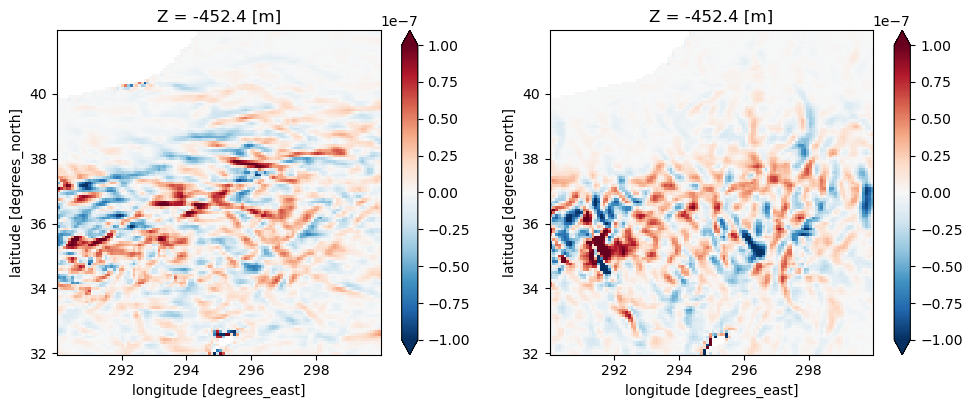

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1483920


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


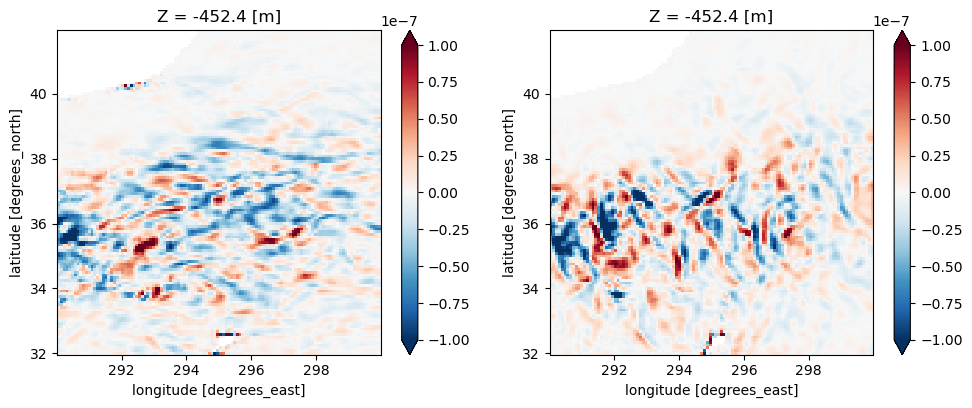

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1486080


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


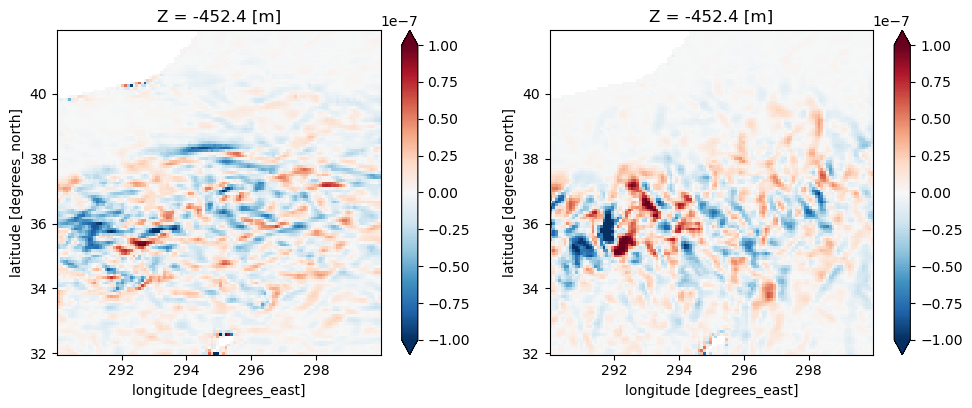

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1488240


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


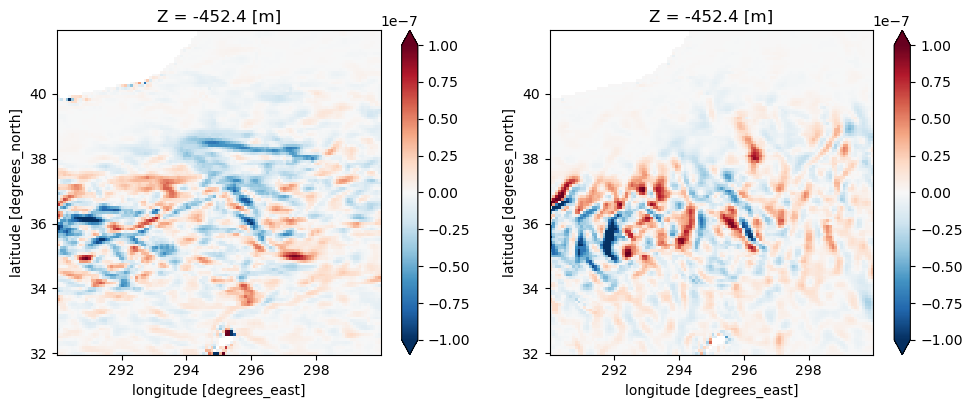

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1490400


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


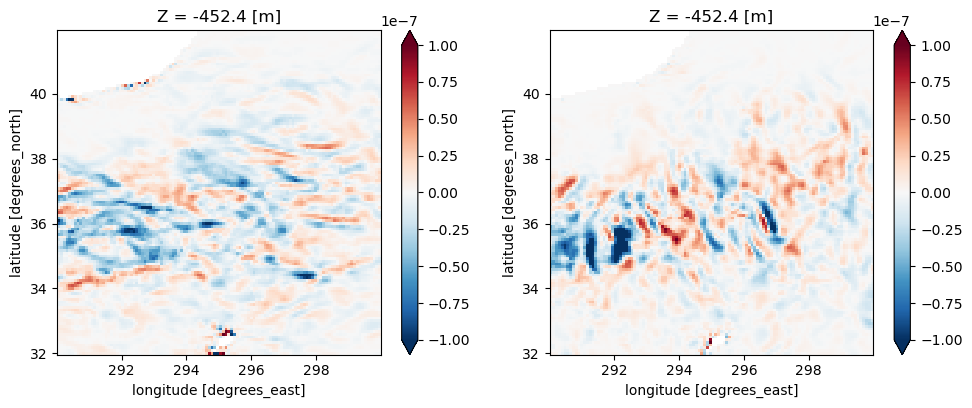

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1492560


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


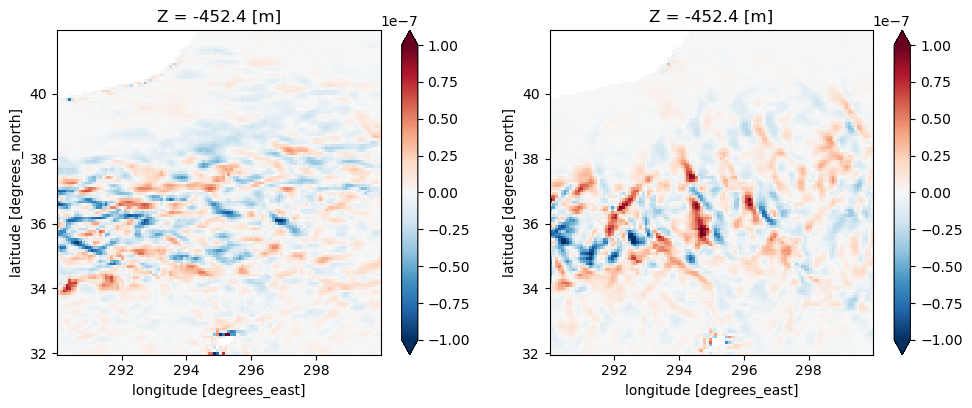

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1494720


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


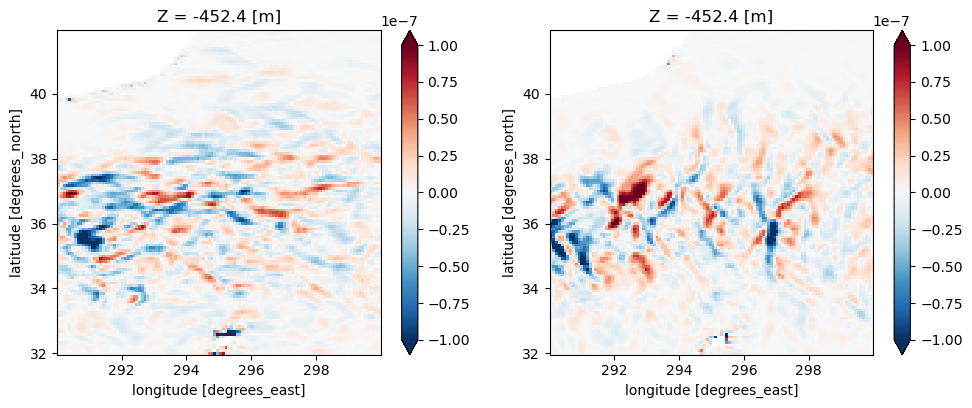

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1496880


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


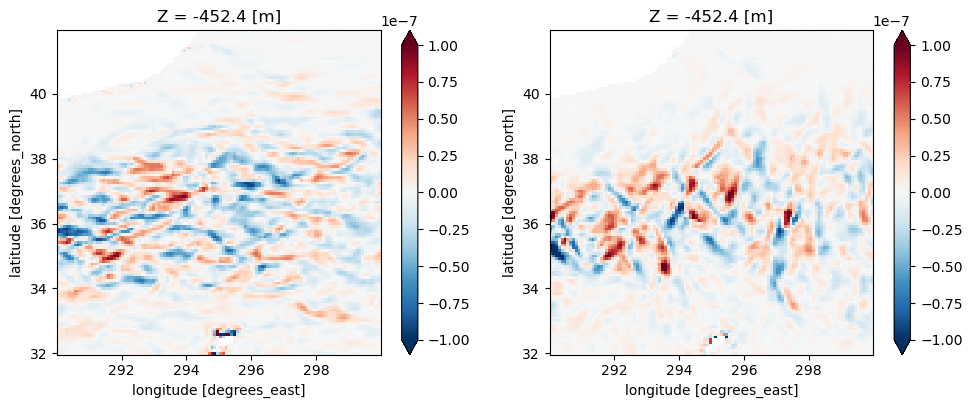

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1499040


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


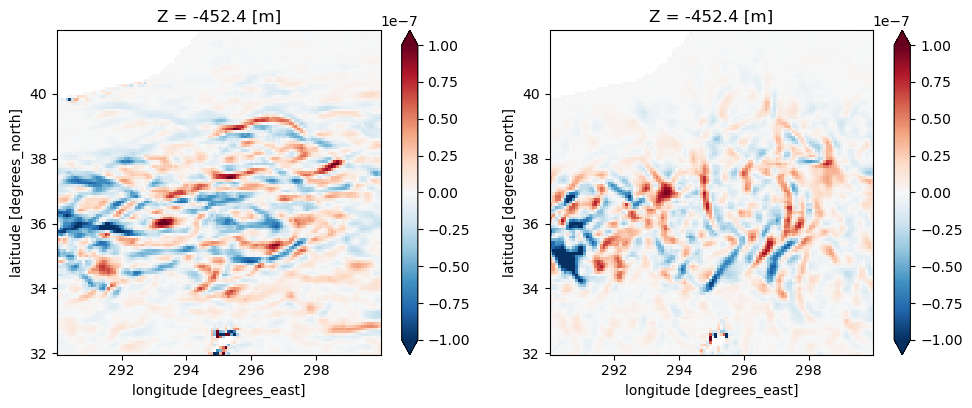

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1501200


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


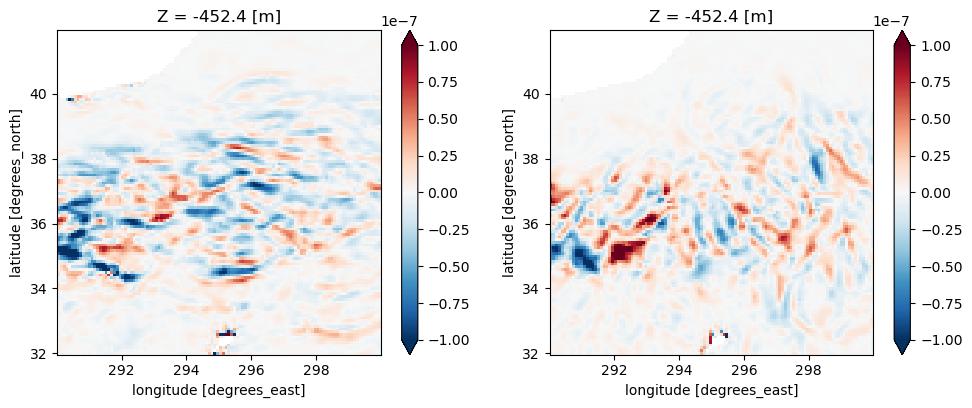

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1503360


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


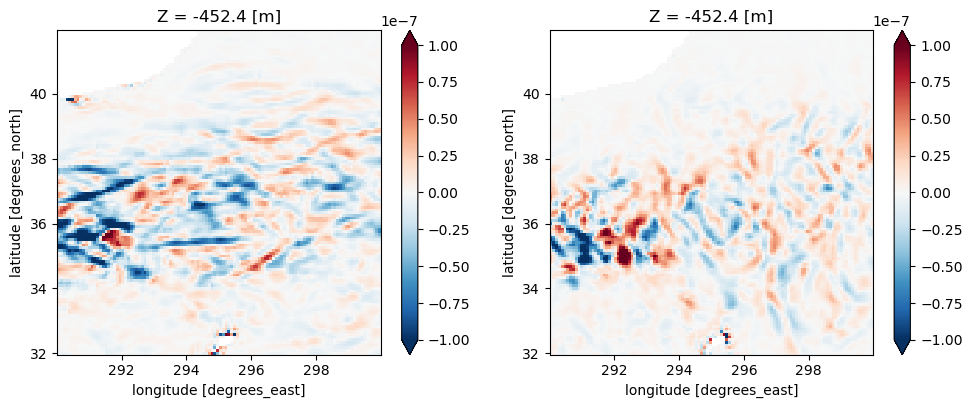

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1505520


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


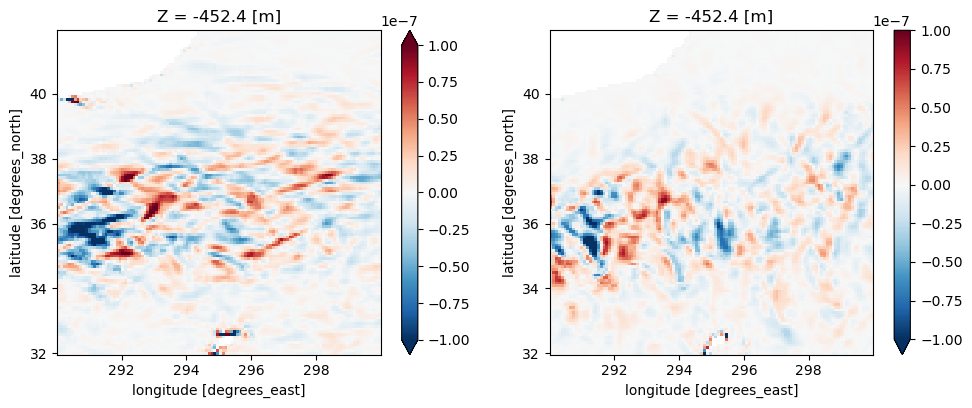

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1507680


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


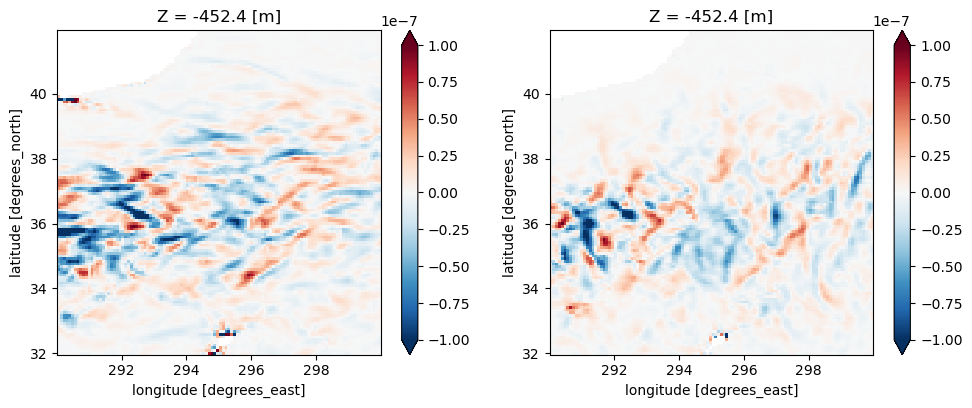

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1509840


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


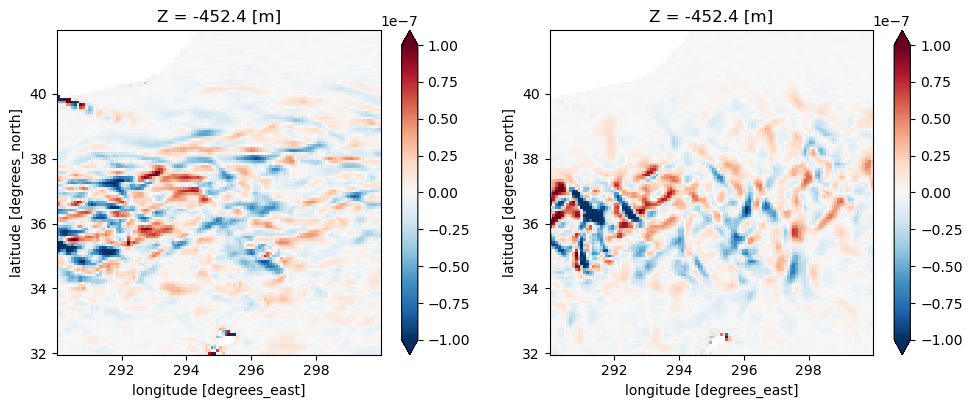

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1512000


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


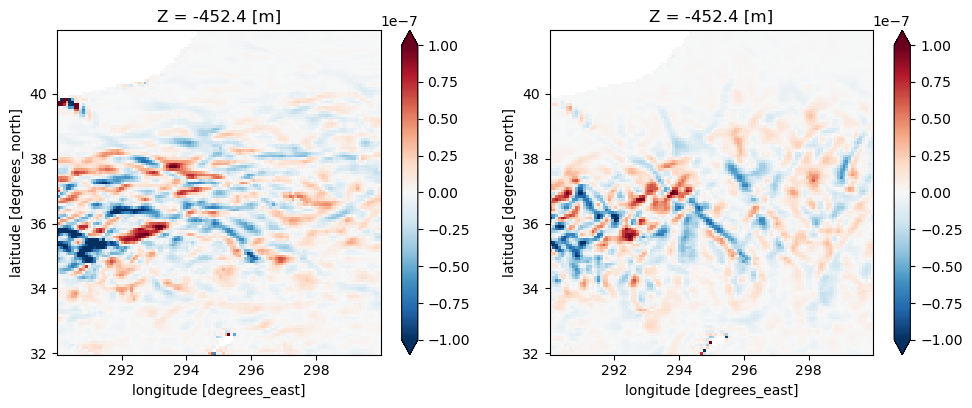

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1514160


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


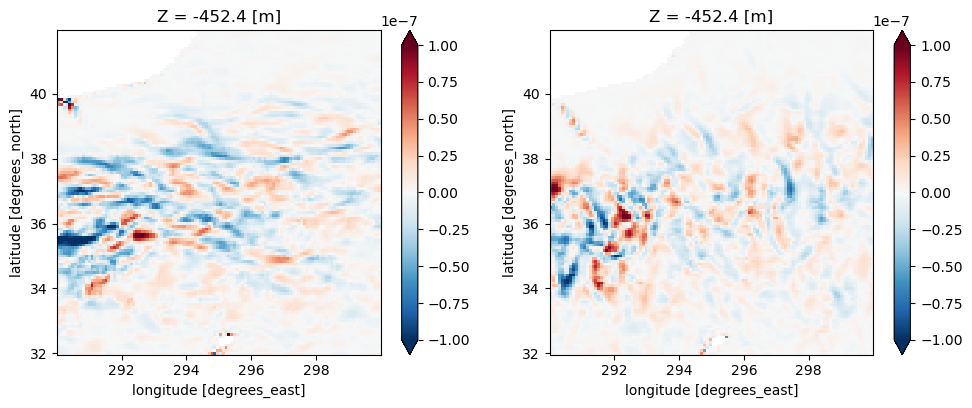

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1516320


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


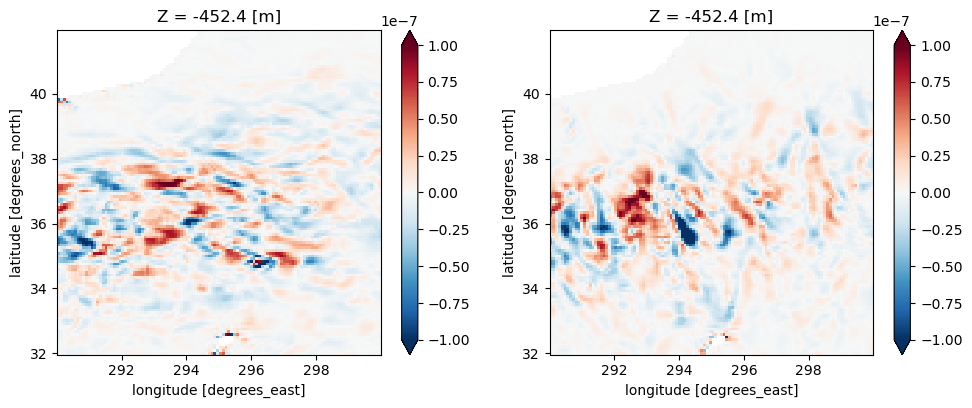

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1518480


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


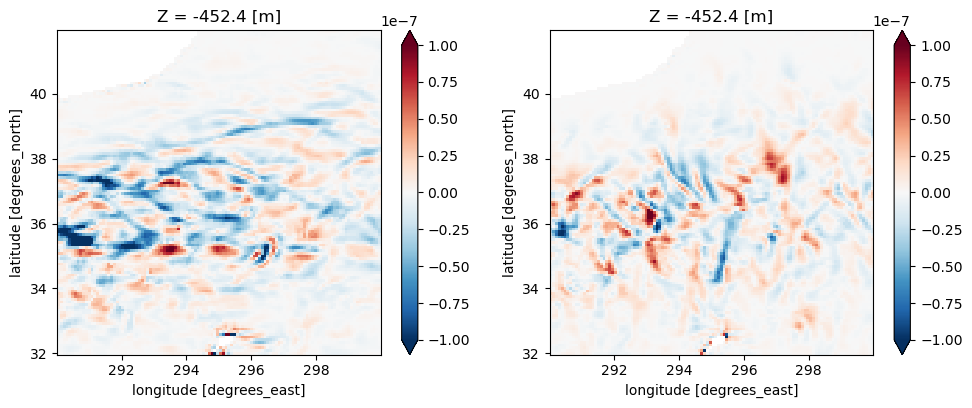

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1520640


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


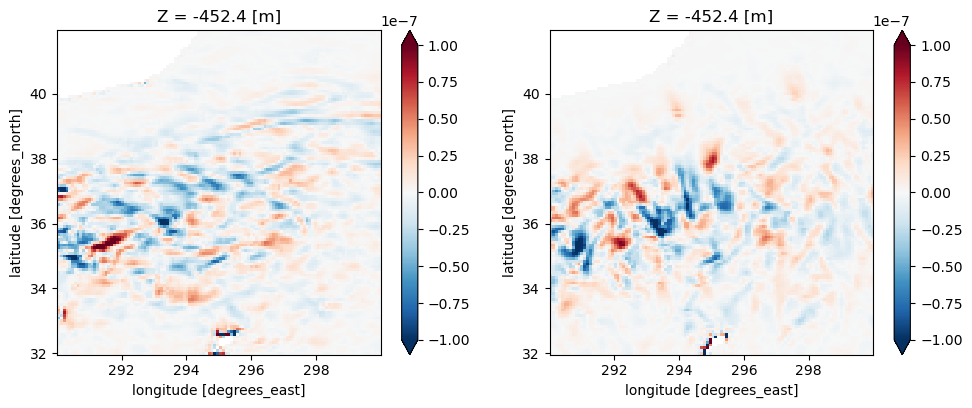

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1522800


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


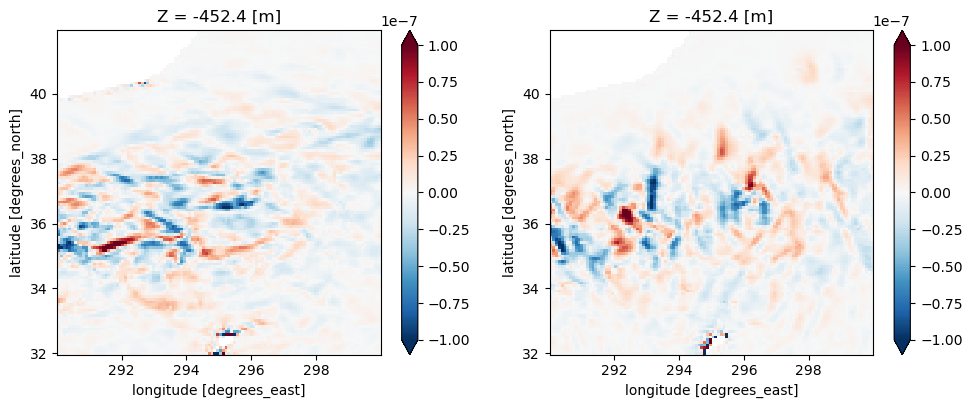

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1524960


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


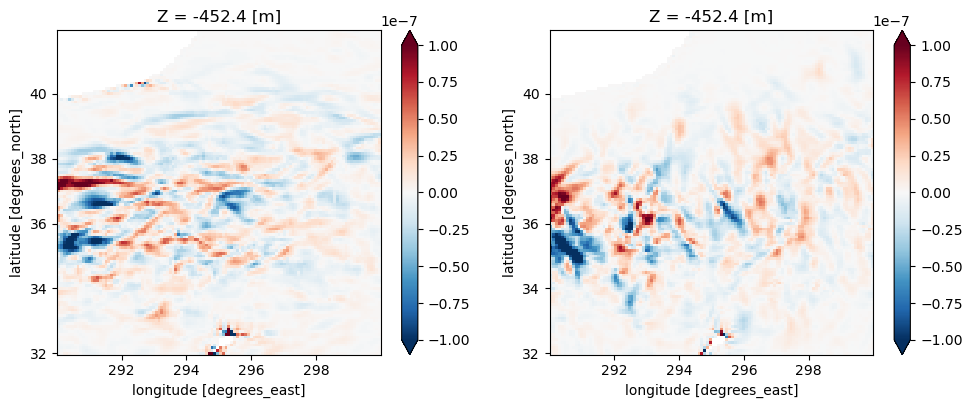

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1527120


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


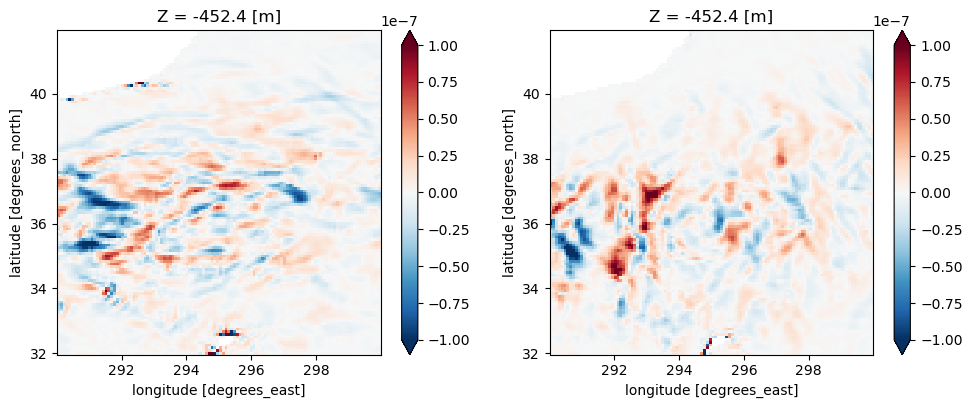

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1529280


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


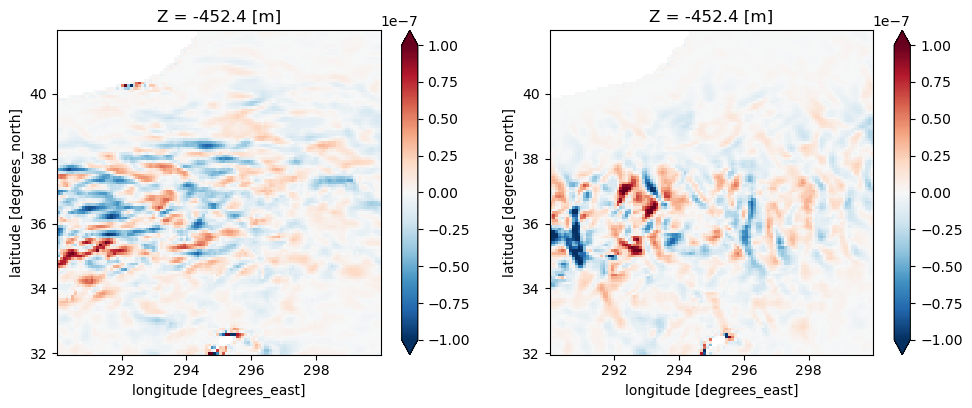

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1531440


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


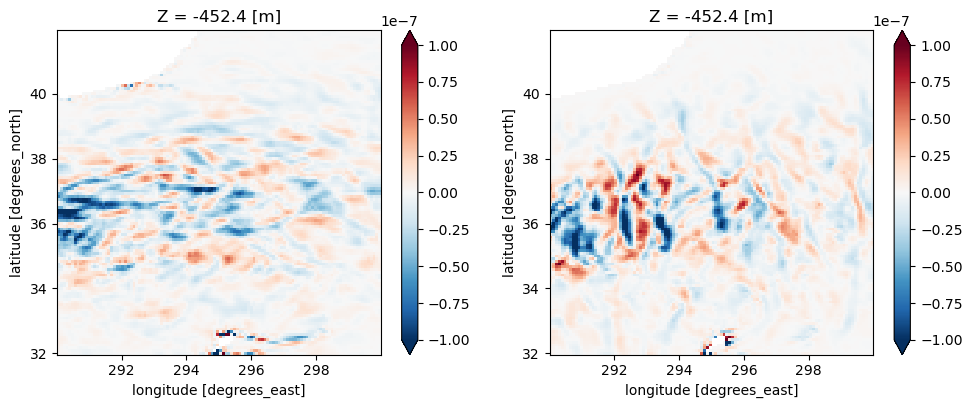

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1533600


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


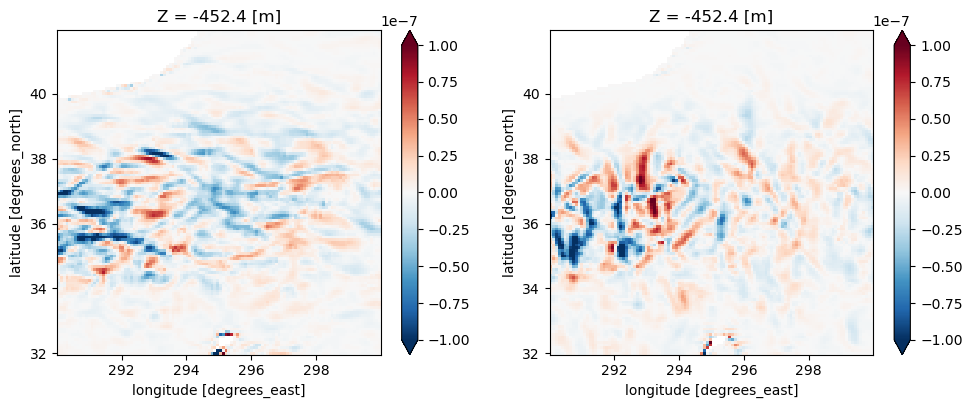

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1535760


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


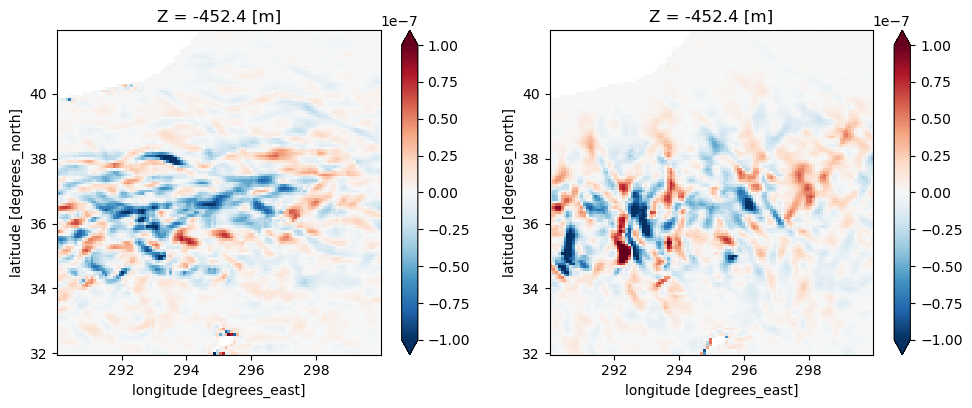

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1537920


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


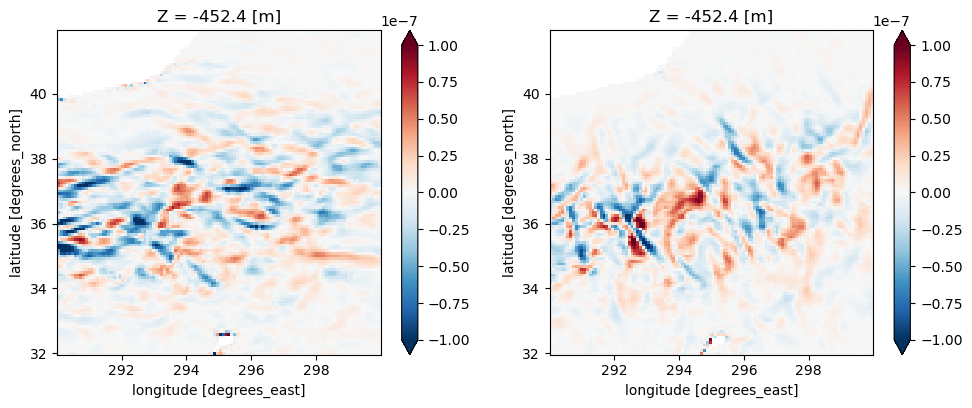

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1540080


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


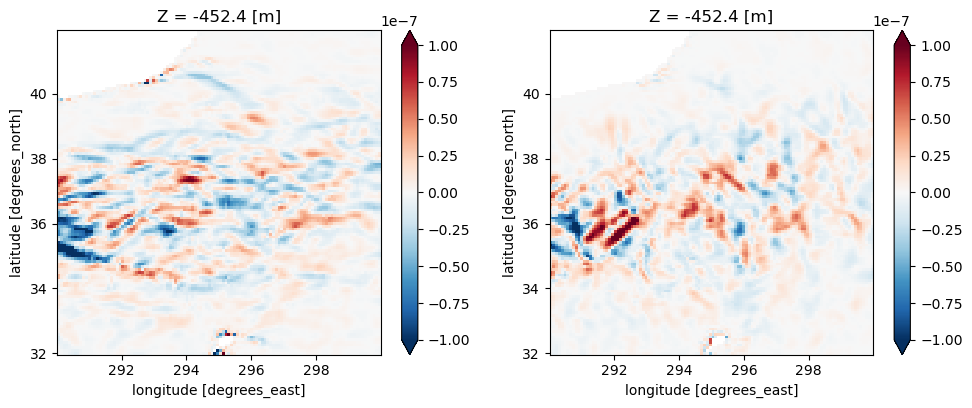

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1542240


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


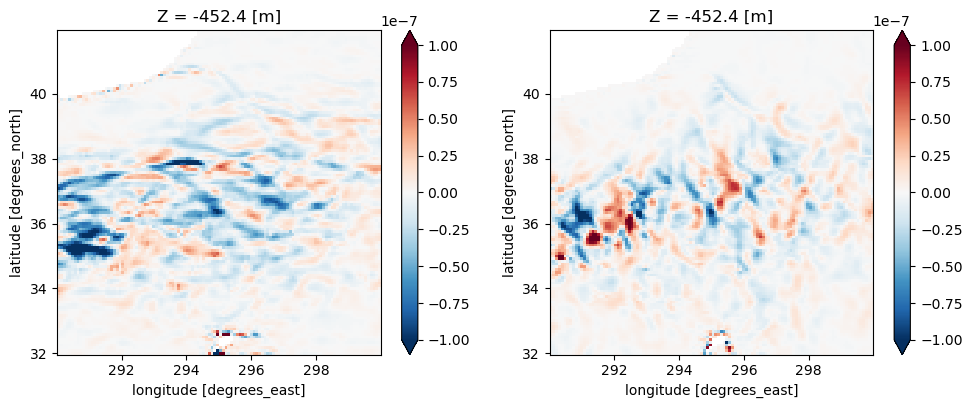

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1544400


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


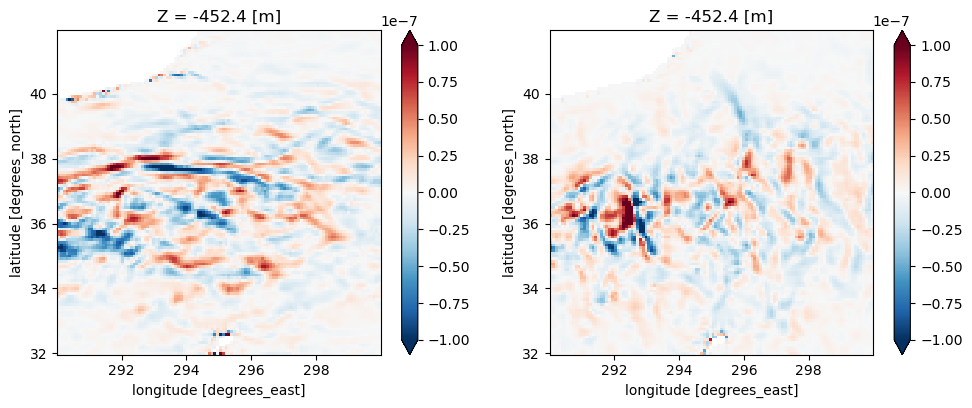

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1546560


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


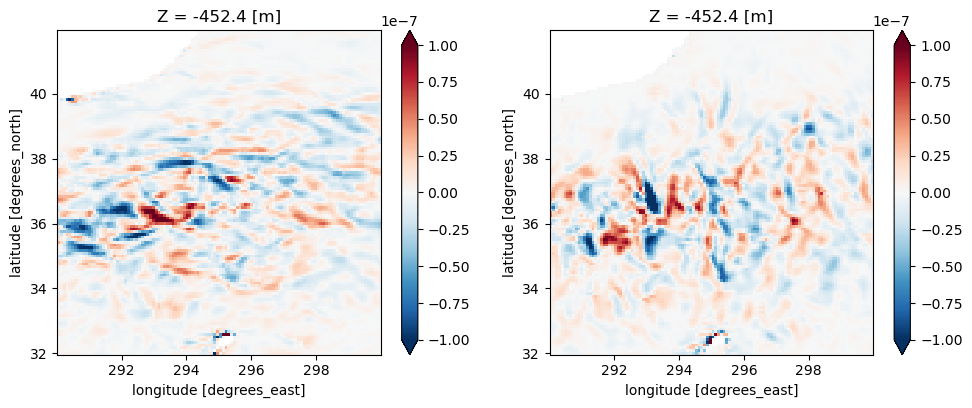

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1548720


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


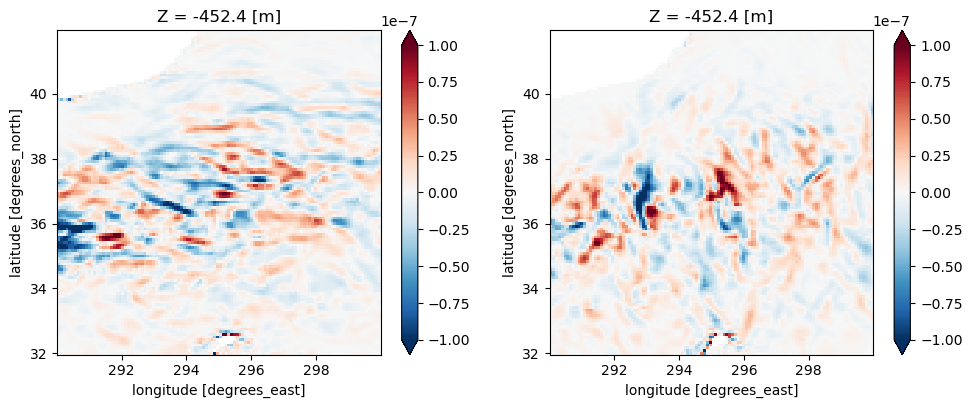

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1550880


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


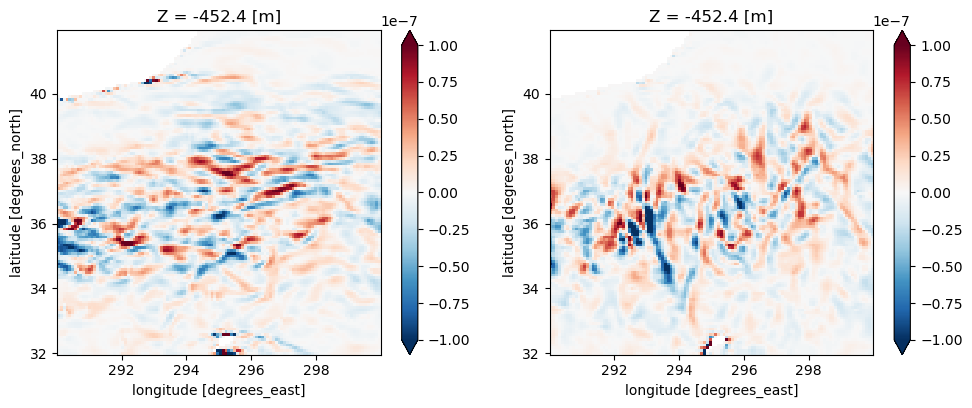

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1553040


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


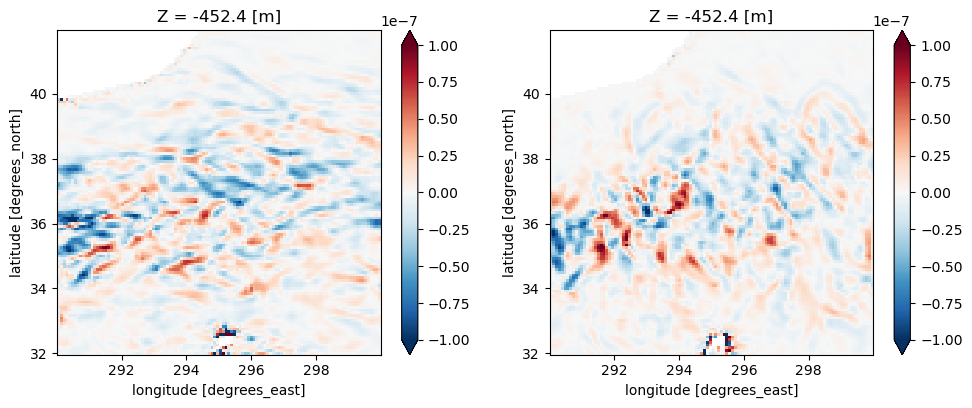

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1555200


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


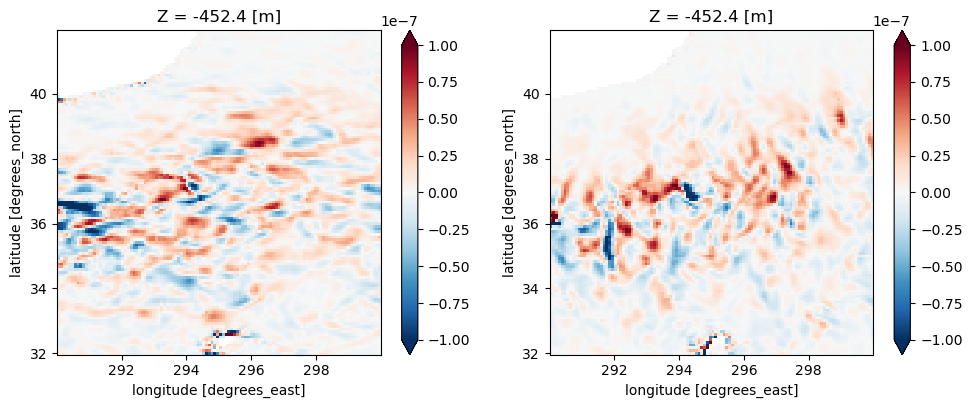

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1557360


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


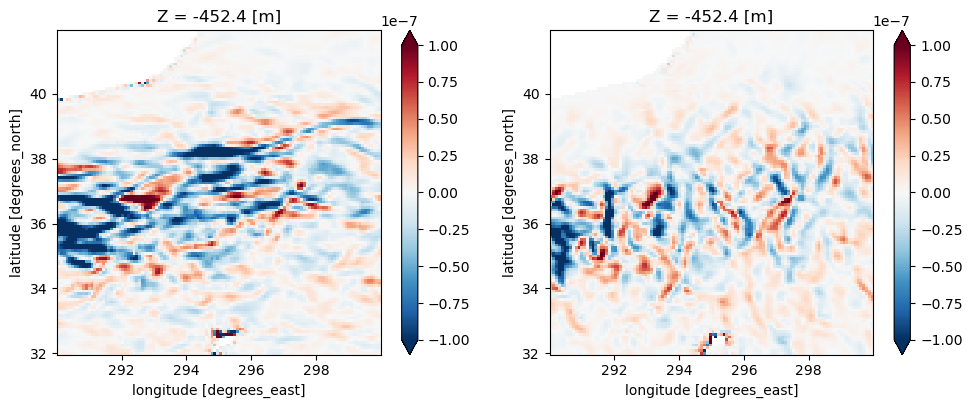

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1559520


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


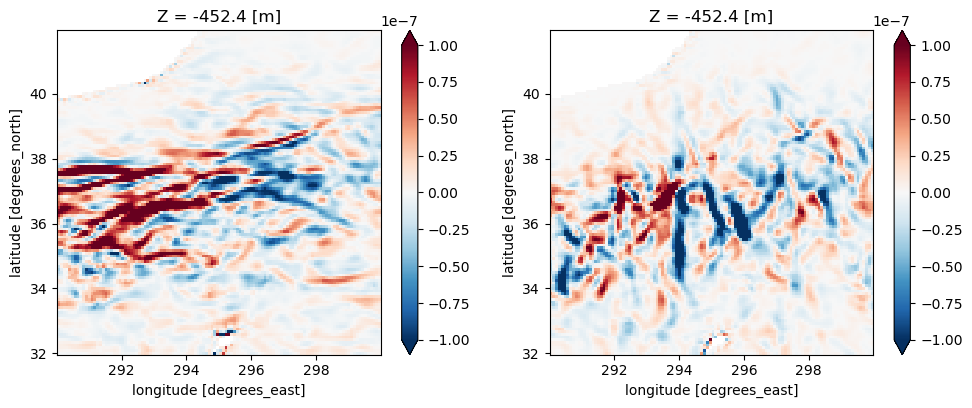

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1561680


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


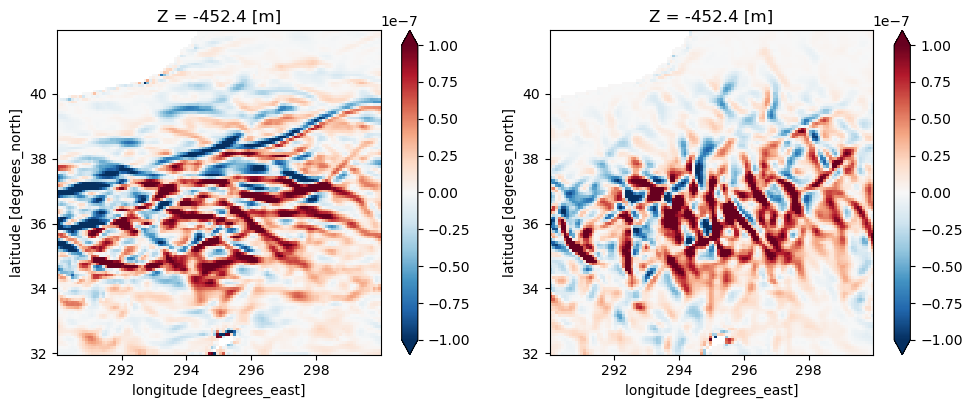

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1563840


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


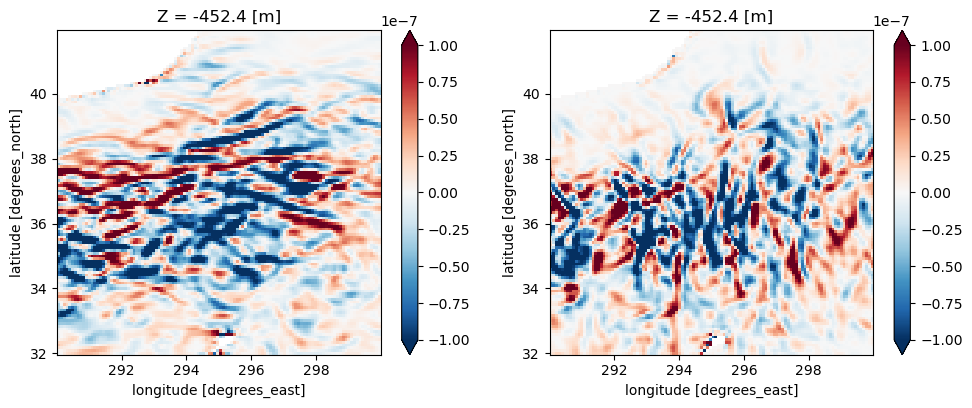

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1566000


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


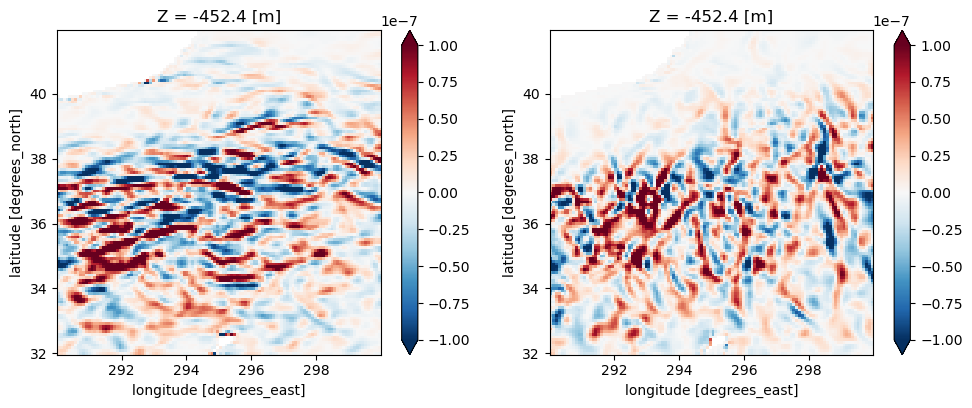

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1568160


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


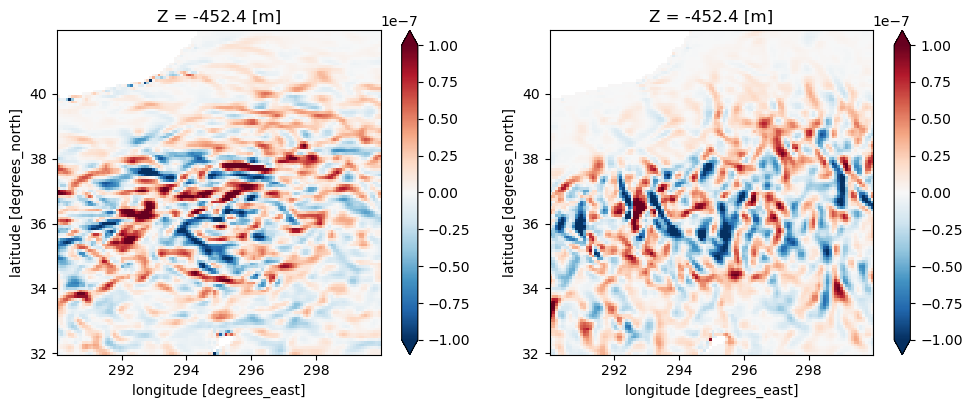

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1570320


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


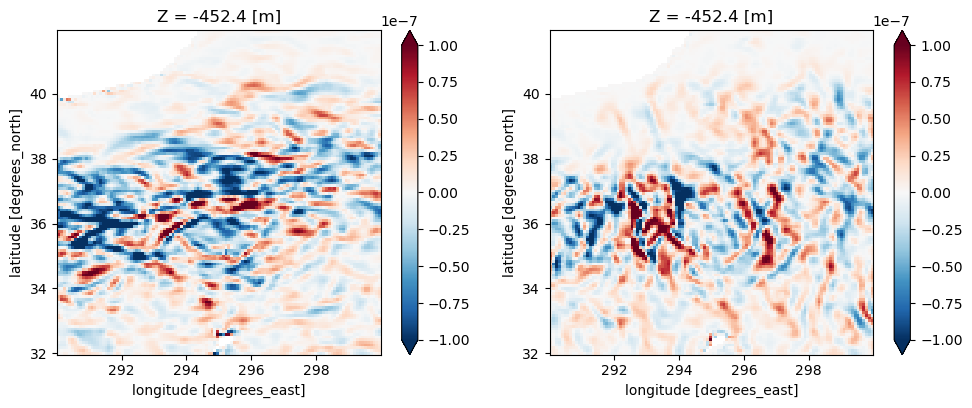

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1572480


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


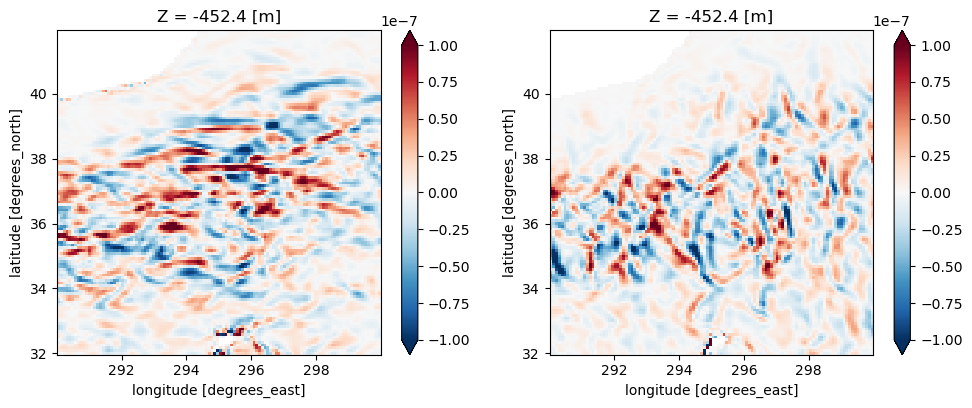

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1574640


In [8]:
reg = 0
dg = 0

for iiter in ntimes[0,dd+1:]:
    dsb = open_mdsdataset(op.join(ddir,'ensm/run1967/ocn'), 
                          grid_dir=gdir,
                          prefix=['snap_diagOcn'], delta_t=2e2,
                          iters=iiter, 
                         ).sel(YC=slice(ys[reg]-5-dg/12,ys[reg]+5+dg/12),
                               YG=slice(ys[reg]-5-dg/12,ys[reg]+5+dg/12),
                               XC=slice(xs[reg]-5-dg/12,xs[reg]+5+dg/12),
                               XG=slice(xs[reg]-5-dg/12,xs[reg]+5+dg/12)
                              ).chunk({'Z':1,'Zl':1,'Zu':1,'Zp1':1}).isel(time=0)

    if len(dsb.XG) > len(dsb.XC):
         dsb = dsb.isel(XG=slice(None,-1))

    grid = Grid(dsb, periodic=[], 
                # coords={'Z': {'center': 'Z', 'outer': 'Zp1', 'left':'Zl', 'right':'Zu'},
                #         'Y': {'center': 'YC', 'left': 'YG'},
                #         'X': {'center': 'XC', 'left': 'XG'}}
               )

    for nmemb in nmembs:
        if nmemb == 100:
            ds = open_mdsdataset(op.join(ddir,'memb%03d/run1967/ocn/' 
                                         % (nmemb)), 
                                 grid_dir=gdir,
                                 prefix=['snap_diagOcn'], delta_t=2e2,
                                 iters=iiter, 
                                 ignore_unknown_vars=True
                                ).isel(time=0).sel(YC=slice(ys[reg]-5,ys[reg]+5),
                                                   YG=slice(ys[reg]-5,ys[reg]+5),
                                                   XC=slice(xs[reg]-5,xs[reg]+5),
                                                   XG=slice(xs[reg]-5,xs[reg]+5)
                                                  )
        else:
            ds1 = open_mdsdataset(op.join(ddir,'memb%03d/run1967/ocn/' 
                                         % (nmemb)), 
                                 grid_dir=gdir,
                                 prefix=['snap_diagOcn'], delta_t=2e2,
                                 iters=iiter, 
                                 ignore_unknown_vars=True
                                ).isel(time=0).sel(YC=slice(ys[reg]-5,ys[reg]+5),
                                                   YG=slice(ys[reg]-5,ys[reg]+5),
                                                   XC=slice(xs[reg]-5,xs[reg]+5),
                                                   XG=slice(xs[reg]-5,xs[reg]+5)
                                                  )
            ds = xr.concat([ds, ds1], dim='nmemb')
            ds1.close()

                # ds = ds.chunk({'nmemb':6})
    ds.coords['nmemb'] = ('nmemb',nmembs)

    if len(ds.XG) > len(ds.XC):
         ds = ds.isel(XG=slice(None,-1))

    
    ub = dsb.UVEL
    vb = dsb.VVEL
    up = ds.UVEL - ub
    vp = ds.VVEL - vb
    
    upC = grid.interp(up,'X',boundary='extend'
                     ).where(ds.maskC!=0.).reset_coords(drop=True).isel(Z=[0,18]).load()
    vpC = grid.interp(vp,'Y',boundary='extend'
                     ).where(ds.maskC!=0.).reset_coords(drop=True).isel(Z=[0,18]).load()

    xA = (ds.dyG * ds.drF).reset_coords(drop=True)
    yA = (ds.dxG * ds.drF).reset_coords(drop=True)

    rTrans = ds.WVEL * ds.rA * grid.interp(ds.hFacC,'Z',boundary='extend')
    Awup = (rTrans
            * grid.interp(grid.interp(up,'Z',boundary='extend'),
                          'X',boundary='extend')
           )

    # rTrans = grid.interp(w,'Y',boundary='extend') * ds.rAs
    Awvp = (rTrans
            * grid.interp(grid.interp(vp,'Z',boundary='extend'),
                          'Y',boundary='extend')
           )
    Aut = (-grid.diff(Awup,'Z',boundary='extend')
           / ds.drF/ds.rA/ds.hFacC
          ).where(ds.maskC!=0.).reset_coords(drop=True).isel(Z=[0,18]).compute()
    Avt = (-grid.diff(Awvp,'Z',boundary='extend')
           / ds.drF/ds.rA/ds.hFacC
          ).where(ds.maskC!=0.).reset_coords(drop=True).isel(Z=[0,18]).compute()
    
    
    fig, (ax1,ax2) = plt.subplots(figsize=(10,4), nrows=1, ncols=2)
    fig.set_tight_layout(True)

    (upC*Aut).isel(Z=1).mean('nmemb').plot(ax=ax1, rasterized=True, vmax=1e-7)
    (vpC*Avt).isel(Z=1).mean('nmemb').plot(ax=ax2, rasterized=True, vmax=1e-7)

    ax1.set_aspect('equal')
    ax2.set_aspect('equal')
    plt.show()
    
    
    xT = grid.cumsum(ds.dxC,'X',boundary='extend'
                    )
    yT = grid.cumsum(ds.dyC,'Y',boundary='extend'
                    )
    Ny, Nx = xT.shape
    xT = xT - xT.isel(XC=Nx//2)
    xT = (xT - xT.isel(YC=-1,XC=0)).values.flatten()
    yT = (yT - yT.isel(YC=0)).values.flatten()
    dx = ds.dxC.min().values
    dy = ds.dyC.min().values
    N = ds.THETA.isel(nmemb=0,Z=0).shape

    xxx, yyy = np.mgrid[0:N[-1]*dx:dx, 0:N[-2]*dy:dy]
    ntheta = 36
    ss = xr.open_zarr(
        '/tank/topog/tuchida/Wavelet-spectrum/isoDiags_KE_region%02d_1967-01-01.zarr' 
                      % reg).scale/xo
    
    rAterp = griddata((xT, yT), ds.rA.values.flatten(),
                  (xxx, yyy) 
                 ).T
    
    uterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
                         coords={'nmemb':nmembs,'Z':upC.Z,
                                 'YC':np.arange(0,N[-2]*dy,dy),
                                 'XC':np.arange(0,N[-1]*dx,dx)}
                        )
    vterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                         coords={'nmemb':nmembs,'Z':vpC.Z,
                                 'YC':np.arange(0,N[-2]*dy,dy),
                                 'XC':np.arange(0,N[-1]*dx,dx)}
                        )

    for iz in range(len(upC.Z)):
        for nn in range(len(nmembs)):
            uterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT),
                                                  (upC*ds.rA
                                                  ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                  (xxx, yyy) 
                                                 ).T 
            vterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT), 
                                                  (vpC*ds.rA
                                                  ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                  (xxx, yyy) 
                                                 ).T 

    uterp = uterp / rAterp
    vterp = vterp / rAterp
    
    Auterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
                         coords={'nmemb':nmembs,'Z':upC.Z,
                                 'YC':np.arange(0,N[-2]*dy,dy),
                                 'XC':np.arange(0,N[-1]*dx,dx)}
                        )
    Avterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                          coords={'nmemb':nmembs,'Z':vpC.Z,
                                  'YC':np.arange(0,N[-2]*dy,dy),
                                  'XC':np.arange(0,N[-1]*dx,dx)}
                         )

    for iz in range(len(upC.Z)):
        for nn in range(len(nmembs)): 
            Auterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT), 
                                                    (Aut*ds.rA
                                                    ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                    (xxx, yyy) 
                                                   ).T
            Avterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT), 
                                                    (Avt*ds.rA
                                                    ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                    (xxx, yyy) 
                                                   ).T 

    Auterp = Auterp / rAterp
    Avterp = Avterp / rAterp

    iso_uwu = xwavelet.wvlt_cross_spectrum(
                        uterp, Auterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
            )
    iso_vwv = xwavelet.wvlt_cross_spectrum(
                        vterp, Avterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
            )

    dsave = iso_uwu.to_dataset(name='iso_uwu')
    dsave['iso_vwv'] = iso_vwv
    dsave.encoding = {}
    fname = op.join(spec,'Points/%s/%010d/isoDiags_u-v-vert-adv.zarr' 
                    % (sreg[reg],iiter))
    dsave.to_zarr(fname, mode='w')
    dsave.close()
    
    print(iiter)

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


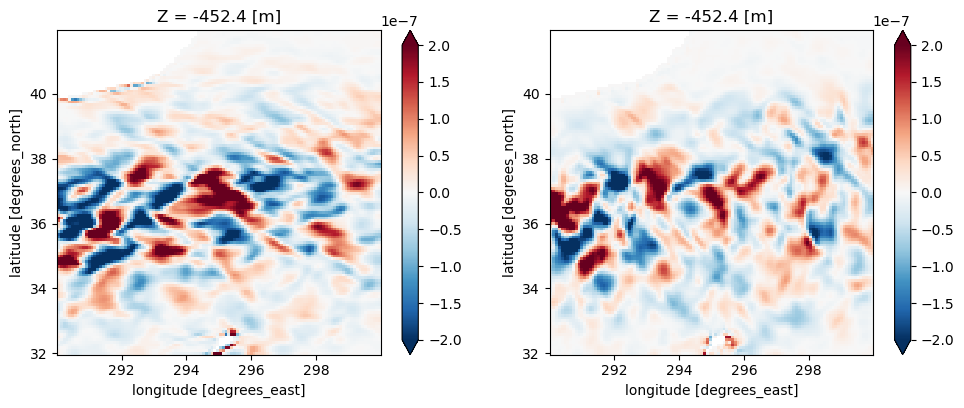

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1425600


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


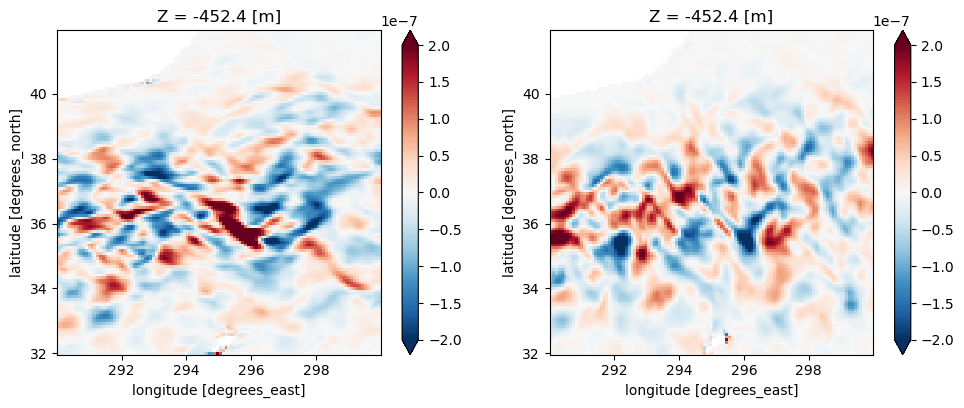

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1432080


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


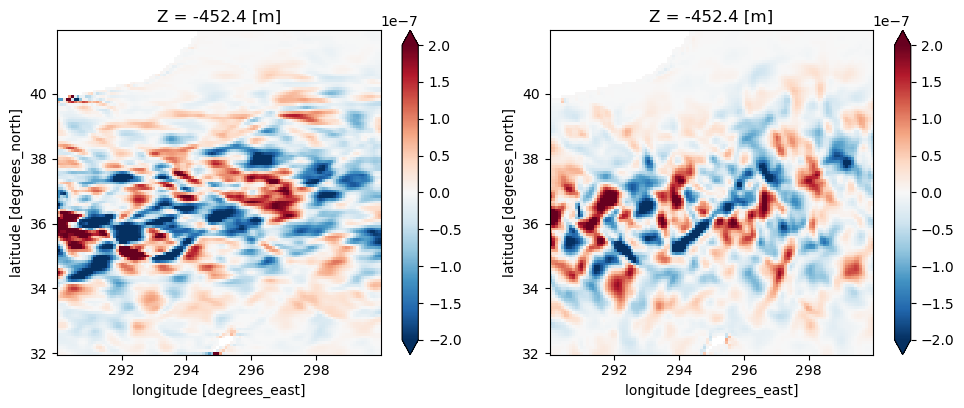

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1438560


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


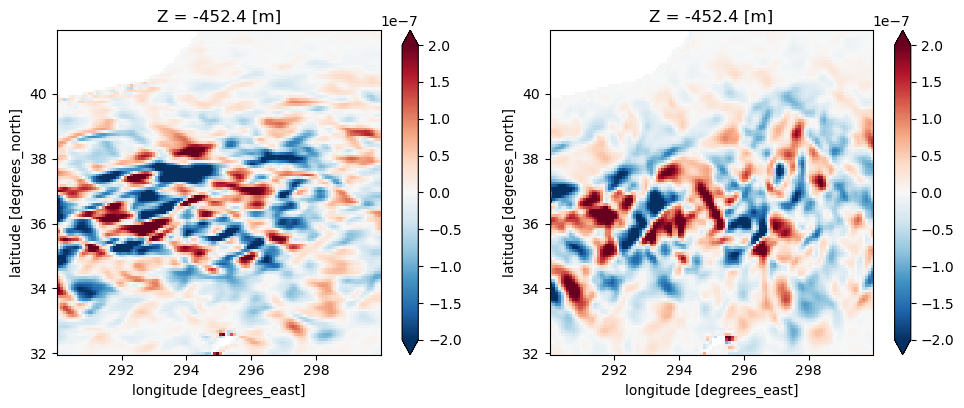

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1445040


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


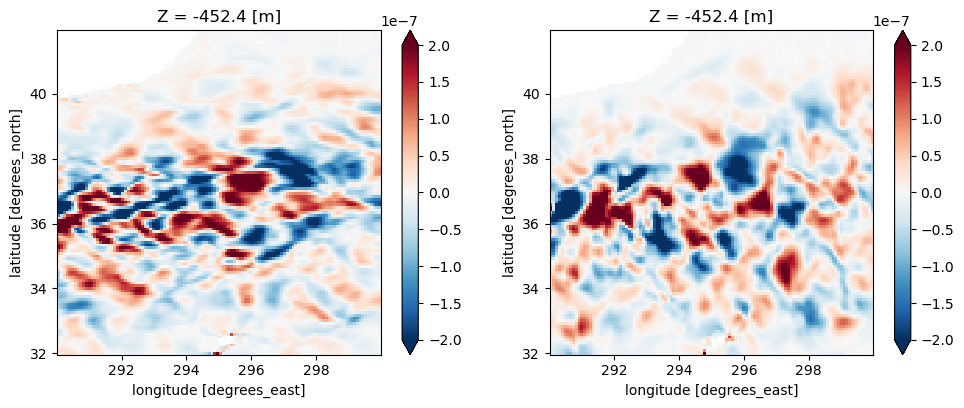

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1451520


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


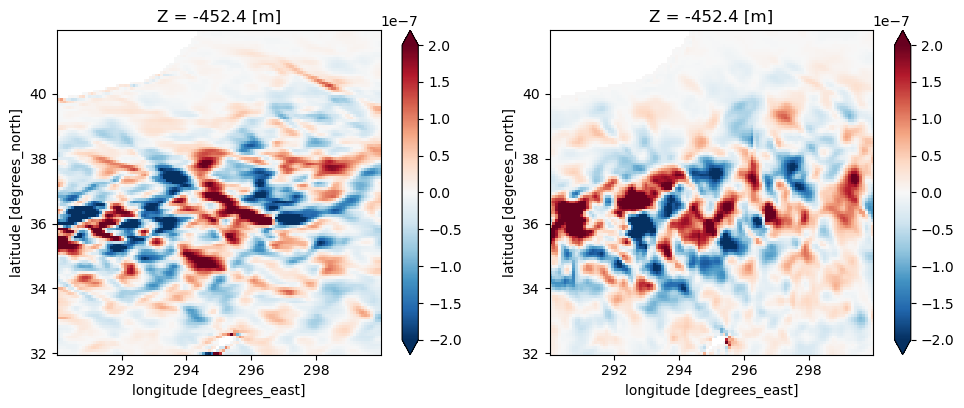

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1458000


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


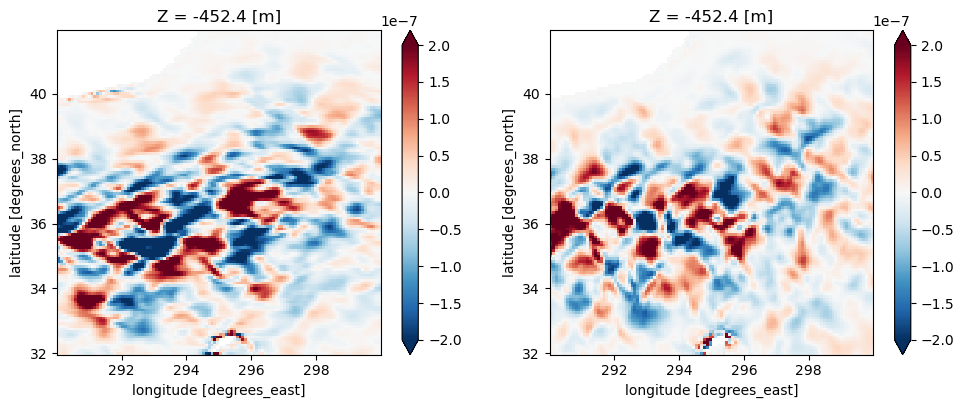

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1464480


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


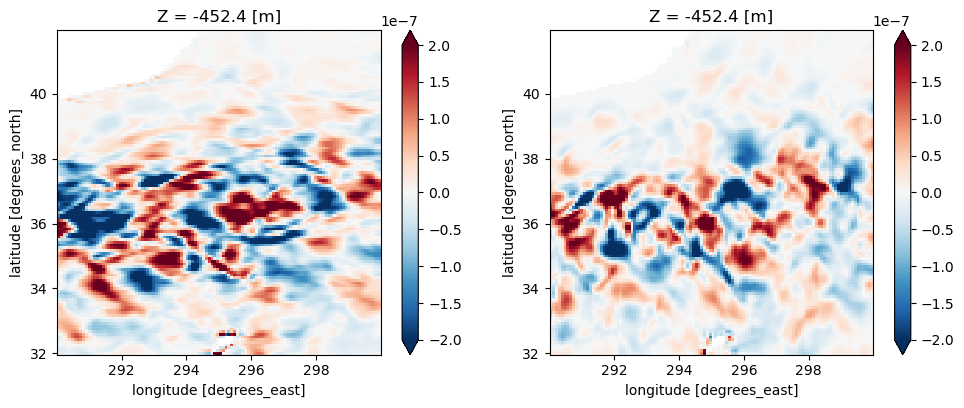

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1470960


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


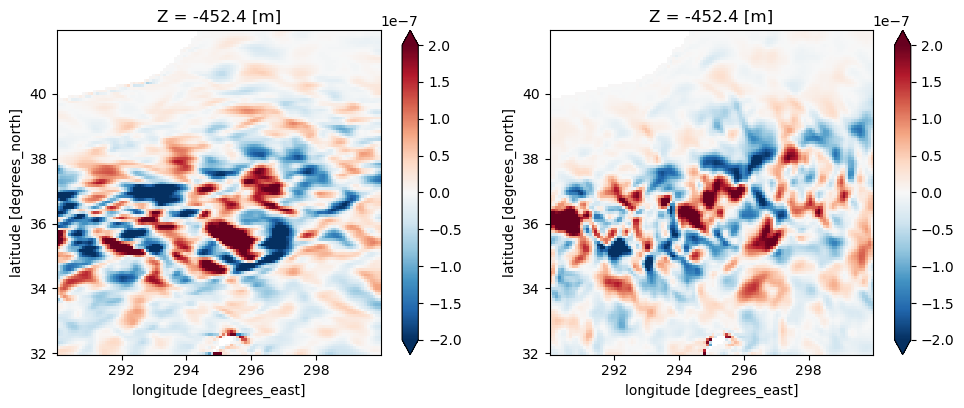

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1477440


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


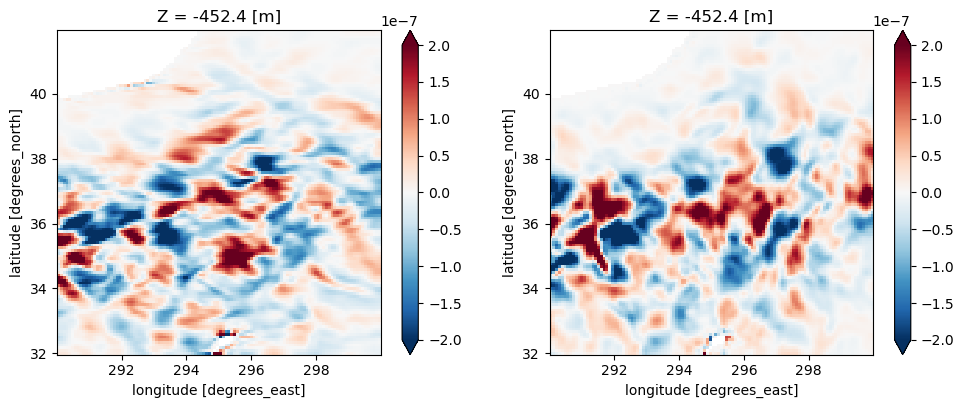

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1483920


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


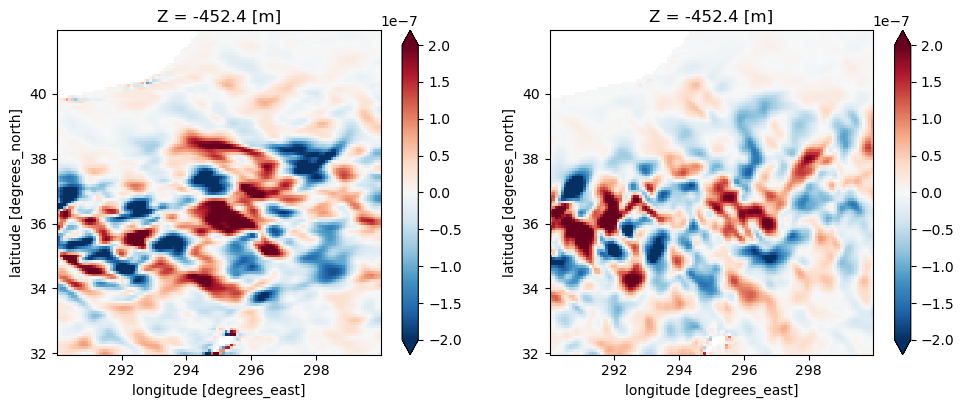

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1490400


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


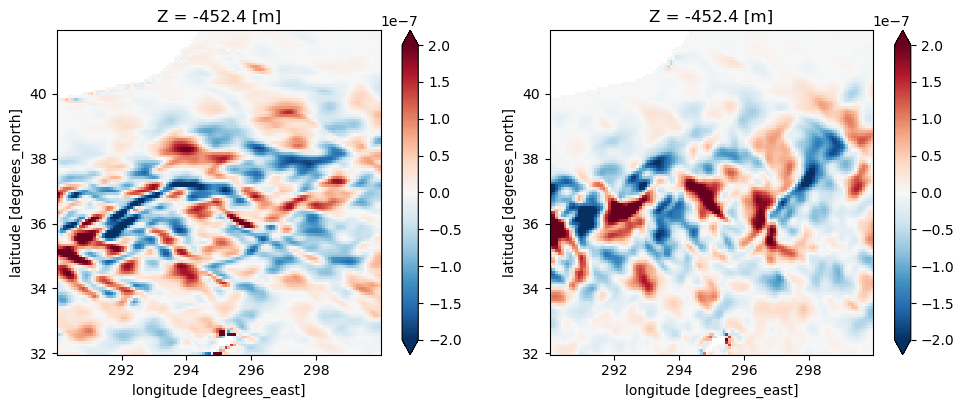

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1496880


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


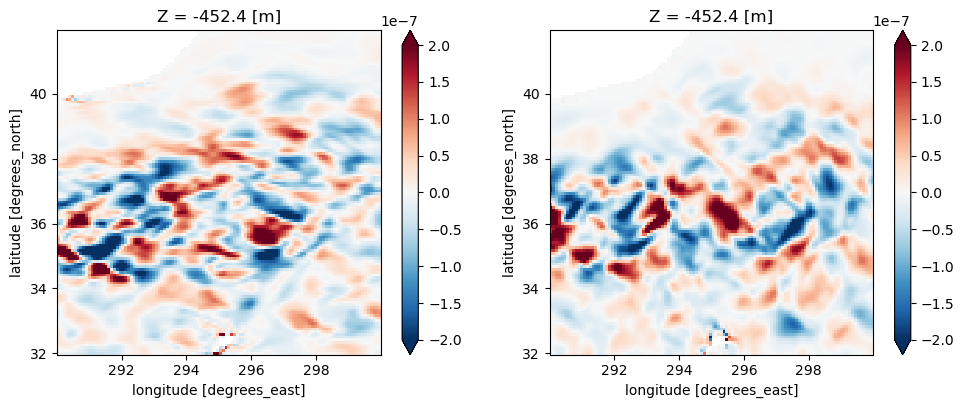

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1503360


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


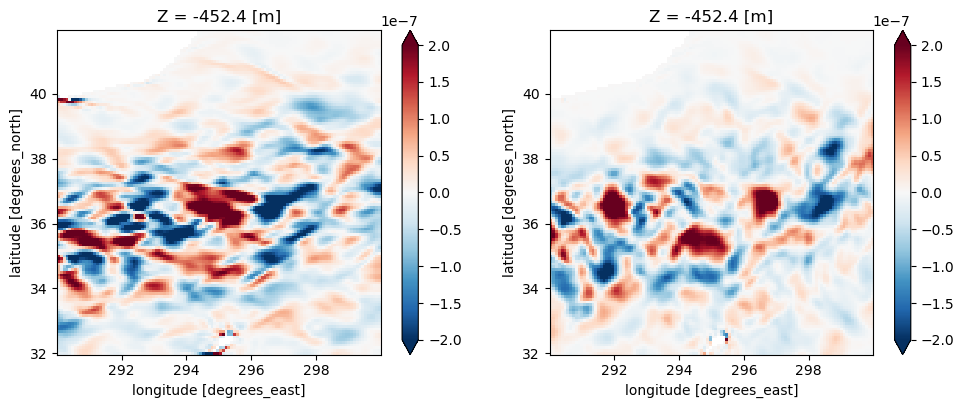

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1509840


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


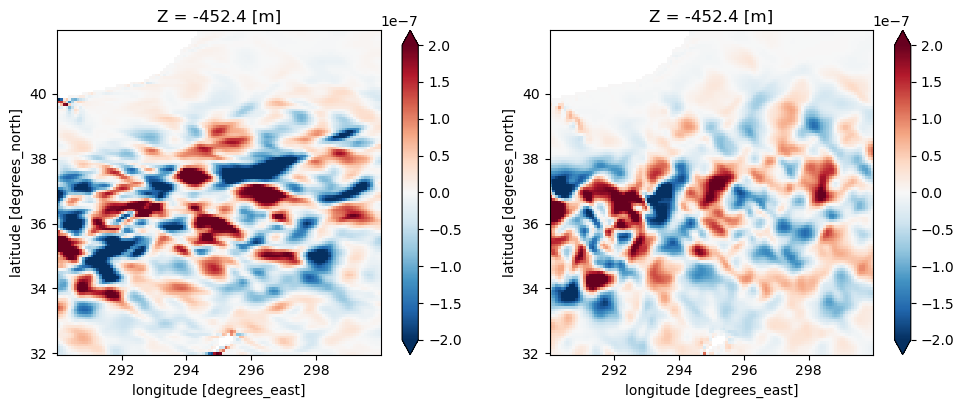

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1516320


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


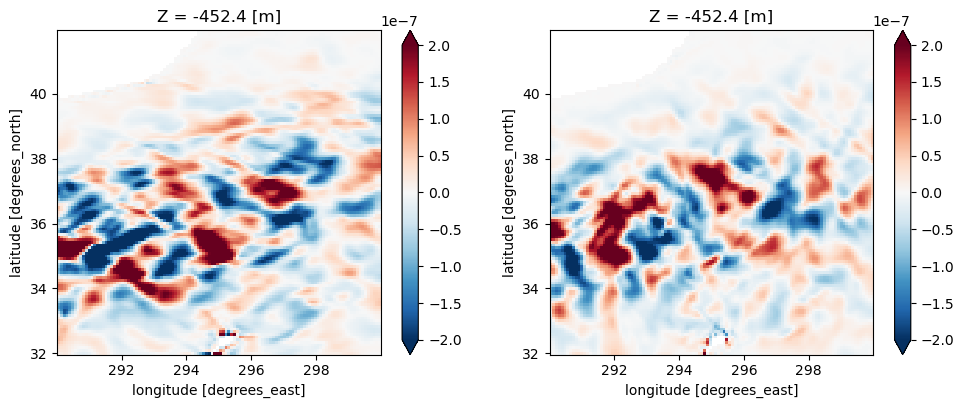

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1522800


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


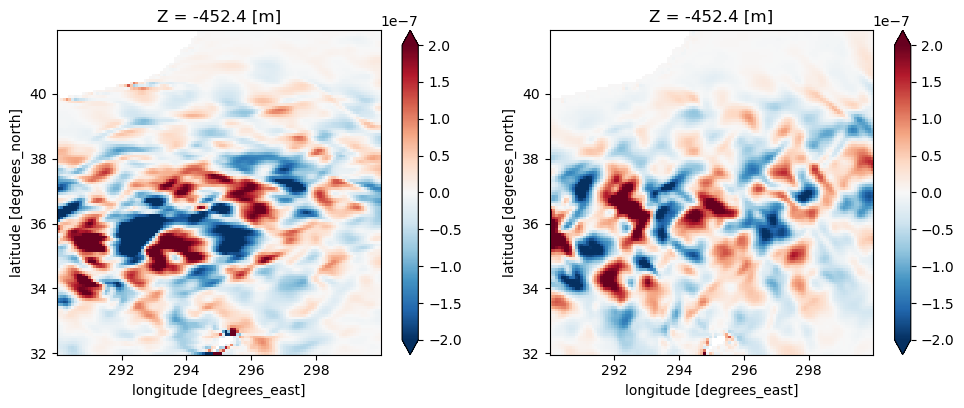

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1529280


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


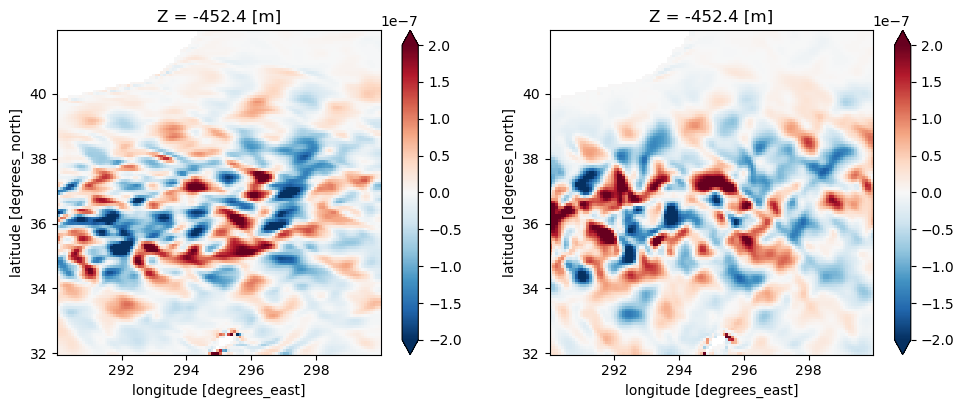

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1535760


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


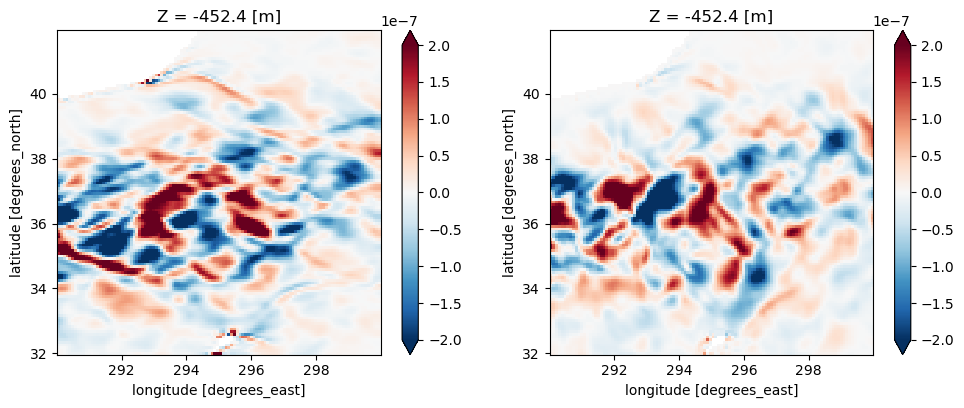

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1542240


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


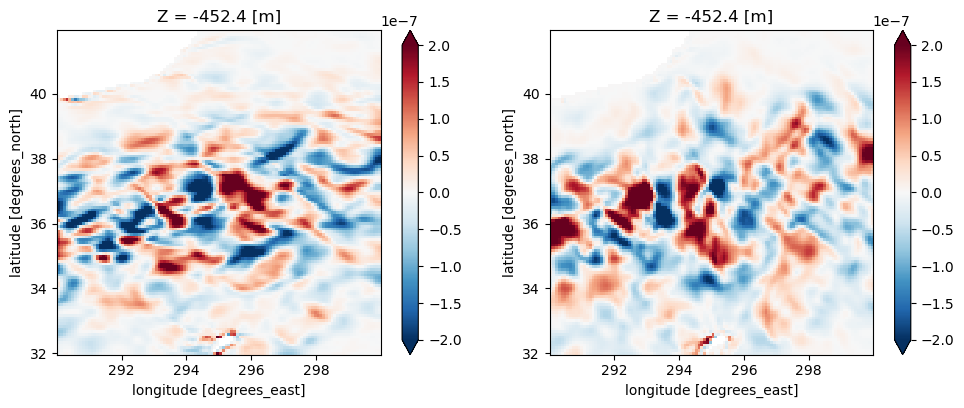

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1548720


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


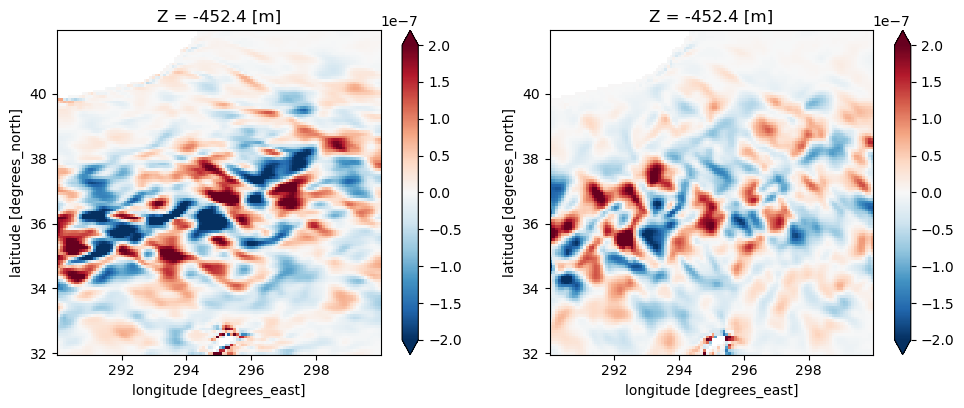

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1555200


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


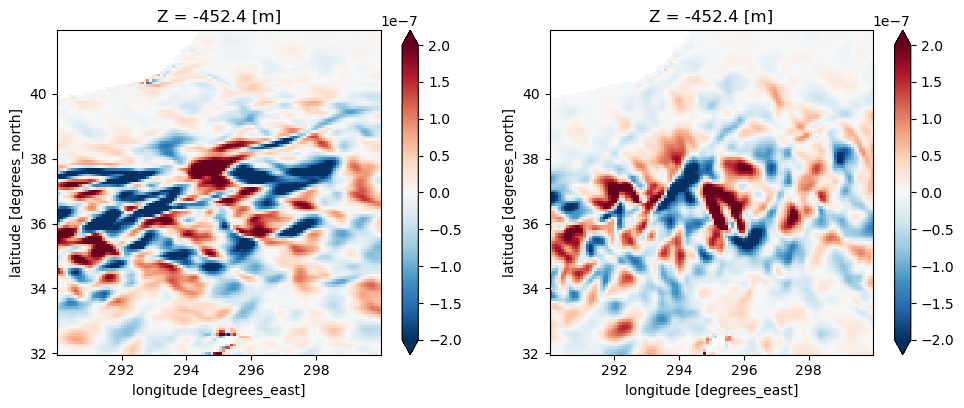

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1561680


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


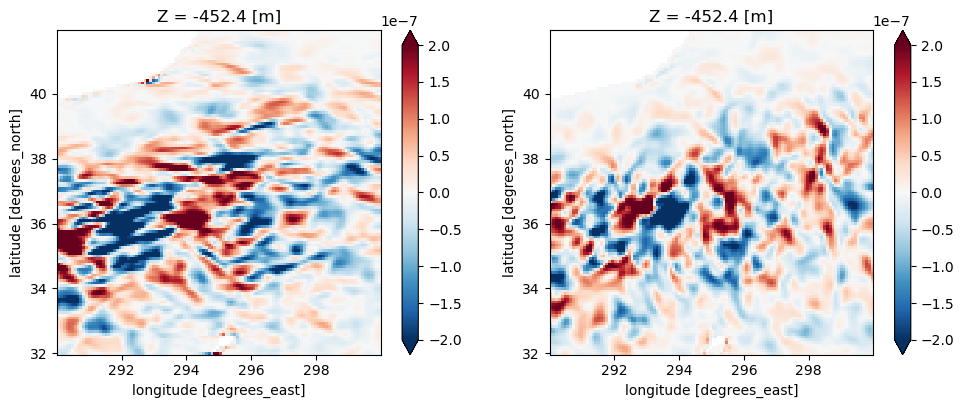

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1568160


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(


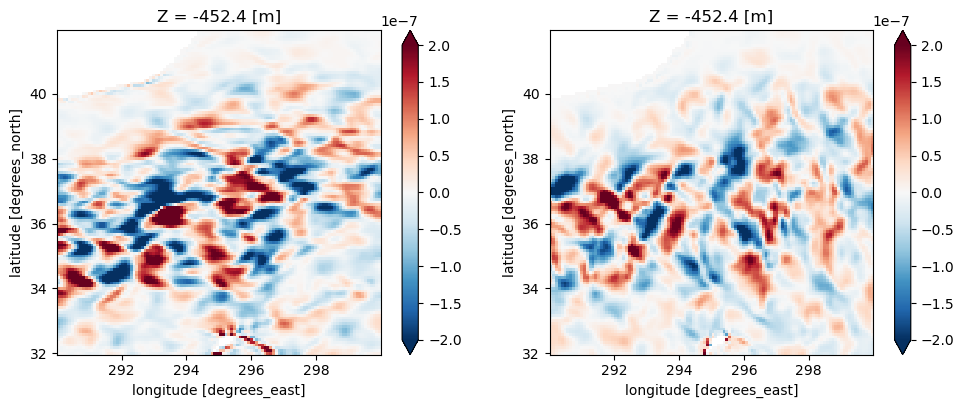

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


1574640


In [18]:
# reg = 5
dg = 0

for iiter in ntimes[0,dd:][::3]:
    dsb = open_mdsdataset(op.join(ddir,'ensm/run1967/ocn'), 
                          grid_dir=gdir,
                          prefix=['snap_diagOcn'], delta_t=2e2,
                          iters=iiter, 
                         ).sel(YC=slice(ys[reg]-5-dg/12,ys[reg]+5+dg/12),
                               YG=slice(ys[reg]-5-dg/12,ys[reg]+5+dg/12),
                               XC=slice(xs[reg]-5-dg/12,xs[reg]+5+dg/12),
                               XG=slice(xs[reg]-5-dg/12,xs[reg]+5+dg/12)
                              ).chunk({'Z':1,'Zl':1,'Zu':1,'Zp1':1}).isel(time=0)
    
    dsA = xr.open_zarr(op.join(diag, 'Snap/Eddy_horiAdv%010d.zarr' 
                              % iiter)
                     ).sel(YC=slice(ys[reg]-5-dg/12,ys[reg]+5+dg/12),
                           YG=slice(ys[reg]-5-dg/12,ys[reg]+5+dg/12),
                           XC=slice(xs[reg]-5-dg/12,xs[reg]+5+dg/12),
                           XG=slice(xs[reg]-5-dg/12,xs[reg]+5+dg/12)
                          ).chunk({'Z':1})
    
    if len(dsb.XG) > len(dsb.XC):
         dsb = dsb.isel(XG=slice(None,-1))
    elif len(dsb.XG) < len(dsb.XC):
         dsb = dsb.isel(XC=slice(1,None))  
    if len(dsA.XG) > len(dsA.XC):
         dsA = dsA.isel(XG=slice(None,-1))
    elif len(dsA.XG) < len(dsA.XC):
         dsA = dsA.isel(XC=slice(1,None))  
            
    grid = Grid(dsb, periodic=[], 
                # coords={
                #     # 'Z': {'center': 'Z', 'outer': 'Zp1', 'left':'Zl', 'right':'Zu'},
                #         'Y': {'center': 'YC', 'left': 'YG'},
                #         'X': {'center': 'XC', 'left': 'XG'}
                # }
               )
    gridz = Grid(dsb.isel(Z=Zs,Zl=Zs,Zu=Zs), periodic=[],
                 coords={
                    # 'Z': {'center': 'Z', 'outer': 'Zp1', 'left':'Zl', 'right':'Zu'},
                         'Y': {'center': 'YC', 'left': 'YG'},
                         'X': {'center': 'XC', 'left': 'XG'}
                 }
                )

    for nmemb in nmembs:
        if nmemb == 100:
            ds = open_mdsdataset(op.join(ddir,'memb%03d/run1967/ocn/' 
                                         % (nmemb)), 
                                 grid_dir=gdir,
                                 prefix=['snap_diagOcn'], delta_t=2e2,
                                 iters=iiter, 
                                 ignore_unknown_vars=True
                                ).isel(time=0).sel(YC=slice(ys[reg]-5,ys[reg]+5),
                                                   YG=slice(ys[reg]-5,ys[reg]+5),
                                                   XC=slice(xs[reg]-5,xs[reg]+5),
                                                   XG=slice(xs[reg]-5,xs[reg]+5)
                                                  )
        else:
            ds1 = open_mdsdataset(op.join(ddir,'memb%03d/run1967/ocn/' 
                                         % (nmemb)), 
                                 grid_dir=gdir,
                                 prefix=['snap_diagOcn'], delta_t=2e2,
                                 iters=iiter, 
                                 ignore_unknown_vars=True
                                ).isel(time=0).sel(YC=slice(ys[reg]-5,ys[reg]+5),
                                                   YG=slice(ys[reg]-5,ys[reg]+5),
                                                   XC=slice(xs[reg]-5,xs[reg]+5),
                                                   XG=slice(xs[reg]-5,xs[reg]+5)
                                                  )
            ds = xr.concat([ds, ds1], dim='nmemb')
            ds1.close()

                # ds = ds.chunk({'nmemb':6})
    ds.coords['nmemb'] = ('nmemb',nmembs)
    
    if len(ds.XG) > len(ds.XC):
         ds = ds.isel(XG=slice(None,-1))
    elif len(ds.XG) < len(ds.XC):
         ds = ds.isel(XC=slice(1,None)) 
    
    ub = dsb.UVEL
    vb = dsb.VVEL
    up = ds.UVEL - ub
    vp = ds.VVEL - vb
    
    upC = grid.interp(up,'X',boundary='extend'
                     ).where(ds.maskC!=0.).reset_coords(drop=True).isel(Z=Zs).load()
    vpC = grid.interp(vp,'Y',boundary='extend'
                     ).where(ds.maskC!=0.).reset_coords(drop=True).isel(Z=Zs).load()

#     xA = (ds.dyG * ds.drF).reset_coords(drop=True)
#     yA = (ds.dxG * ds.drF).reset_coords(drop=True)

#     uTrans = ds.UVEL * xA
#     vTrans = ds.VVEL * yA
#     # rTrans = grid.interp(ds.WVEL,'X',boundary='extend') * ds.rAw
#     Auup = (grid.interp(uTrans,'X',boundary='extend')
#             * grid.interp(up,'X',boundary='extend')
#            )
#     Avup = (grid.interp(vTrans,'X',boundary='extend')
#             * grid.interp(up,'Y',boundary='extend')
#            )
#     # Awup = (rTrans
#     #         * grid.interp(up,'Z',boundary='extend')
#     #        )
#     # rTrans = grid.interp(ds.WVEL,'Y',boundary='extend') * ds.rAs
#     Auvp = (grid.interp(uTrans,'Y',boundary='extend')
#             * grid.interp(vp,'X',boundary='extend')
#            )
#     Avvp = (grid.interp(vTrans,'Y',boundary='extend')
#             * grid.interp(vp,'Y',boundary='extend')
#            )
#     # Awvp = (rTrans
#     #         * grid.interp(vp,'Z',boundary='extend')
#     #        )
#     Auh = grid.interp(((grid.diff(Auup,'X',boundary='extend')
#                         + grid.diff(Avup,'Y',boundary='extend')
#                         # - grid.diff(Awup,'Z',boundary='extend')
#                        ) / ds.drF/ds.rAw
#                       ).reset_coords(drop=True),
#                       'X',boundary='extend').where(ds.maskC!=0.).isel(Z=Zs).compute()
#     Avh = grid.interp(((grid.diff(Auvp,'X',boundary='extend')
#                         + grid.diff(Avvp,'Y',boundary='extend')
#                         # - grid.diff(Awvp,'Z',boundary='extend')
#                        ) / ds.drF/ds.rAs
#                       ).reset_coords(drop=True),
#                       'Y',boundary='extend').where(ds.maskC!=0.).isel(Z=Zs).compute()

    Auh = gridz.interp(-dsA.Um_Advec.where(ds.maskW.isel(Z=Zs)!=0.).fillna(0.),
                       'X',boundary='extend'
                      ).where(ds.maskC.isel(Z=Zs)!=0.
                             ).reset_coords(drop=True)
    Avh = gridz.interp(-dsA.Vm_Advec.where(ds.maskS.isel(Z=Zs)!=0.).fillna(0.),
                       'Y',boundary='extend'
                      ).where(ds.maskC.isel(Z=Zs)!=0.
                             ).reset_coords(drop=True)
    
    fig, (ax1,ax2) = plt.subplots(figsize=(10,4), nrows=1, ncols=2)
    fig.set_tight_layout(True)

    (upC*Auh).isel(Z=1).mean('nmemb').plot(ax=ax1, rasterized=True, vmax=2e-7)
    (vpC*Avh).isel(Z=1).mean('nmemb').plot(ax=ax2, rasterized=True, vmax=2e-7)

    ax1.set_aspect('equal')
    ax2.set_aspect('equal')
    plt.show()
    
    
    xT = grid.cumsum(ds.dxC,'X',boundary='extend'
                    )
    yT = grid.cumsum(ds.dyC,'Y',boundary='extend'
                    )
    Ny, Nx = xT.shape
    xT = xT - xT.isel(XC=Nx//2)
    xT = (xT - xT.isel(YC=-1,XC=0)).values.flatten()
    yT = (yT - yT.isel(YC=0)).values.flatten()
    dx = ds.dxC.min().values
    dy = ds.dyC.min().values
    N = ds.THETA.isel(nmemb=0,Z=0).shape

    xxx, yyy = np.mgrid[0:N[-1]*dx:dx, 0:N[-2]*dy:dy]
    ntheta = 36
    ss = xr.open_zarr(
        '/tank/topog/tuchida/Wavelet-spectrum/isoDiags_KE_region%02d_1967-01-01.zarr' 
                      % reg).scale/xo
    
    rAterp = griddata((xT, yT), ds.rA.values.flatten(),
                  (xxx, yyy) 
                 ).T
    
    uterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
                         coords={'nmemb':nmembs,'Z':upC.Z,
                                 'YC':np.arange(0,N[-2]*dy,dy),
                                 'XC':np.arange(0,N[-1]*dx,dx)}
                        )
    vterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                         coords={'nmemb':nmembs,'Z':vpC.Z,
                                 'YC':np.arange(0,N[-2]*dy,dy),
                                 'XC':np.arange(0,N[-1]*dx,dx)}
                        )

    for iz in range(len(upC.Z)):
        for nn in range(len(nmembs)):
            uterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT),
                                                  (upC*ds.rA
                                                  ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                  (xxx, yyy) 
                                                 ).T 
            vterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT), 
                                                  (vpC*ds.rA
                                                  ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                  (xxx, yyy) 
                                                 ).T 

    uterp = uterp / rAterp
    vterp = vterp / rAterp
    
    Auterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
                         coords={'nmemb':nmembs,'Z':upC.Z,
                                 'YC':np.arange(0,N[-2]*dy,dy),
                                 'XC':np.arange(0,N[-1]*dx,dx)}
                        )
    Avterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                          coords={'nmemb':nmembs,'Z':vpC.Z,
                                  'YC':np.arange(0,N[-2]*dy,dy),
                                  'XC':np.arange(0,N[-1]*dx,dx)}
                         )

    for iz in range(len(upC.Z)):
        for nn in range(len(nmembs)): 
            Auterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT), 
                                                    (Auh*ds.rA
                                                    ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                    (xxx, yyy) 
                                                   ).T
            Avterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT), 
                                                    (Avh*ds.rA
                                                    ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                    (xxx, yyy) 
                                                   ).T 

    Auterp = Auterp / rAterp
    Avterp = Avterp / rAterp

    iso_uuu = xwavelet.wvlt_cross_spectrum(
                        uterp, Auterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
            )
    iso_vuv = xwavelet.wvlt_cross_spectrum(
                        vterp, Avterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
            )

    dsave = iso_uuu.to_dataset(name='iso_uuu')
    dsave['iso_vuv'] = iso_vuv
    dsave.encoding = {}
    fname = op.join(spec,'Points/%s/%010d/isoDiags_u-v-hor-adv_diag.zarr' 
                    % (sreg[reg],iiter))
    dsave.to_zarr(fname, mode='w')
    dsave.close()
    ds.close(); dsA.close()
    
    print(iiter)

In [19]:
diags = np.concatenate((np.arange(-1,0),np.arange(1,2)))
# diags = np.arange(-1,2)
iiter = ntimes[0,0]

for ng in diags[:]:
    nx = ng
    ny = 0
    dsb = open_mdsdataset(op.join(ddir,'ensm/run1967/ocn'), 
                          grid_dir=gdir,
                          prefix=['snap_diagOcn'], delta_t=2e2,
                          iters=iiter, 
                         ).sel(YC=slice(ys[reg]-5+ny/12,ys[reg]+5+ny/12),
                               YG=slice(ys[reg]-5+ny/12,ys[reg]+5+ny/12),
                               XC=slice(xs[reg]-5+nx/12,xs[reg]+5+nx/12),
                               XG=slice(xs[reg]-5+nx/12,xs[reg]+5+nx/12)
                              ).chunk({'Z':1,'Zl':1,'Zu':1,'Zp1':1}).isel(time=0)

    if len(dsb.XG) > len(dsb.XC):
        dsb = dsb.isel(XG=slice(None,-1))
    elif len(dsb.XG) < len(dsb.XC):
        dsb = dsb.isel(XC=slice(None,-1))


    grid = Grid(dsb, periodic=[], 
            # coords={'Z': {'center': 'Z', 'outer': 'Zp1', 'left':'Zl', 'right':'Zu'},
            #         'Y': {'center': 'YC', 'left': 'YG'},
            #         'X': {'center': 'XC', 'left': 'XG'}}
           )
    
    
    for nmemb in nmembs:
        if nmemb == 100:
            ds = open_mdsdataset(op.join(ddir,'memb%03d/run1967/ocn/' 
                                         % (nmemb)), 
                                 grid_dir=gdir,
                                 prefix=['snap_diagOcn'], delta_t=2e2,
                                 iters=iiter, 
                                 ignore_unknown_vars=True
                                ).isel(time=0).sel(YC=slice(ys[reg]-5+ny/12,ys[reg]+5+ny/12),
                                                   YG=slice(ys[reg]-5+ny/12,ys[reg]+5+ny/12),
                                                   XC=slice(xs[reg]-5+nx/12,xs[reg]+5+nx/12),
                                                   XG=slice(xs[reg]-5+nx/12,xs[reg]+5+nx/12)
                                                  )
       
        else:
            ds1 = open_mdsdataset(op.join(ddir,'memb%03d/run1967/ocn/' 
                                         % (nmemb)), 
                                 grid_dir=gdir,
                                 prefix=['snap_diagOcn'], delta_t=2e2,
                                 iters=iiter, 
                                 ignore_unknown_vars=True
                                ).isel(time=0).sel(YC=slice(ys[reg]-5+ny/12,ys[reg]+5+ny/12),
                                                   YG=slice(ys[reg]-5+ny/12,ys[reg]+5+ny/12),
                                                   XC=slice(xs[reg]-5+nx/12,xs[reg]+5+nx/12),
                                                   XG=slice(xs[reg]-5+nx/12,xs[reg]+5+nx/12)
                                                  )
            ds = xr.concat([ds, ds1], dim='nmemb')
            ds1.close()
            
    ds.coords['nmemb'] = ('nmemb',nmembs)
    if len(ds.XG) > len(ds.XC):
        ds = ds.isel(XG=slice(None,-1))
    elif len(ds.XG) < len(ds.XC):
        ds = ds.isel(XC=slice(None,-1))
        
        
    ub = dsb.UVEL
    vb = dsb.VVEL
    up = ds.UVEL - ub
    vp = ds.VVEL - vb
    
    upC = grid.interp(up,'X',boundary='extend'
                     ).where(ds.maskC!=0.).reset_coords(drop=True).isel(Z=[0,18]).load()
    vpC = grid.interp(vp,'Y',boundary='extend'
                     ).where(ds.maskC!=0.).reset_coords(drop=True).isel(Z=[0,18]).load()

    xA = (ds.dyG * ds.drF).reset_coords(drop=True)
    yA = (ds.dxG * ds.drF).reset_coords(drop=True)

    rTrans = ds.WVEL * ds.rA * grid.interp(ds.hFacC,'Z',boundary='extend')
    Awup = (rTrans
            * grid.interp(grid.interp(up,'Z',boundary='extend'),
                          'X',boundary='extend')
           )

    # rTrans = grid.interp(w,'Y',boundary='extend') * ds.rAs
    Awvp = (rTrans
            * grid.interp(grid.interp(vp,'Z',boundary='extend'),
                          'Y',boundary='extend')
           )
    Aut = (-grid.diff(Awup,'Z',boundary='extend')
           / ds.drF/ds.rA/ds.hFacC
          ).where(ds.maskC!=0.).reset_coords(drop=True).isel(Z=[0,18]).compute()
    Avt = (-grid.diff(Awvp,'Z',boundary='extend')
           / ds.drF/ds.rA/ds.hFacC
          ).where(ds.maskC!=0.).reset_coords(drop=True).isel(Z=[0,18]).compute()
            
        
    xT = grid.cumsum(ds.dxC,'X',boundary='extend'
                    )
    yT = grid.cumsum(ds.dyC,'Y',boundary='extend'
                    )
    Ny, Nx = xT.shape
    xT = xT - xT.isel(XC=Nx//2)
    xT = (xT - xT.isel(YC=-1,XC=0)).values.flatten()
    yT = (yT - yT.isel(YC=0)).values.flatten()
    dx = ds.dxC.min().values
    dy = ds.dyC.min().values
    N = ds.THETA.isel(nmemb=0,Z=0).shape

    xxx, yyy = np.mgrid[0:N[-1]*dx:dx, 0:N[-2]*dy:dy]
    ntheta = 36
    ss = xr.open_zarr(
        '/tank/topog/tuchida/Wavelet-spectrum/isoDiags_KE_region%02d_1967-01-01.zarr' 
                      % reg).scale/xo
    
    rAterp = griddata((xT, yT), ds.rA.values.flatten(),
                  (xxx, yyy) 
                 ).T
    
    uterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
                         coords={'nmemb':nmembs,'Z':upC.Z,
                                 'YC':np.arange(0,N[-2]*dy,dy),
                                 'XC':np.arange(0,N[-1]*dx,dx)}
                        )
    vterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                         coords={'nmemb':nmembs,'Z':vpC.Z,
                                 'YC':np.arange(0,N[-2]*dy,dy),
                                 'XC':np.arange(0,N[-1]*dx,dx)}
                        )

    for iz in range(len(upC.Z)):
        for nn in range(len(nmembs)):
            uterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT),
                                                  (upC*ds.rA
                                                  ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                  (xxx, yyy) 
                                                 ).T 
            vterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT), 
                                                  (vpC*ds.rA
                                                  ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                  (xxx, yyy) 
                                                 ).T 

    uterp = uterp / rAterp
    vterp = vterp / rAterp
    
    Auterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
                         coords={'nmemb':nmembs,'Z':upC.Z,
                                 'YC':np.arange(0,N[-2]*dy,dy),
                                 'XC':np.arange(0,N[-1]*dx,dx)}
                        )
    Avterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                          coords={'nmemb':nmembs,'Z':vpC.Z,
                                  'YC':np.arange(0,N[-2]*dy,dy),
                                  'XC':np.arange(0,N[-1]*dx,dx)}
                         )

    for iz in range(len(upC.Z)):
        for nn in range(len(nmembs)): 
            Auterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT), 
                                                    (Aut*ds.rA
                                                    ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                    (xxx, yyy) 
                                                   ).T
            Avterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT), 
                                                    (Avt*ds.rA
                                                    ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                    (xxx, yyy) 
                                                   ).T 

    Auterp = Auterp / rAterp
    Avterp = Avterp / rAterp

    iso_uwu = xwavelet.wvlt_cross_spectrum(
                        uterp, Auterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
            )
    iso_vwv = xwavelet.wvlt_cross_spectrum(
                        vterp, Avterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
            )

    dsave = iso_uwu.to_dataset(name='iso_uwu')
    dsave['iso_vwv'] = iso_vwv
    if np.allclose(dsave.scale.data, ss.data*xo):
        pass
    else:
        break
    dsave.encoding = {}
    if ny < 0:
        if nx < 0:
            fname = op.join(spec,'Z0452/Points/%s/%010d/isoDiags_u-v-vert-adv_-%02d-%02d.zarr' 
                            % (sreg[reg],iiter,np.abs(ny),np.abs(nx)))
        else:
            fname = op.join(spec,'Z0452/Points/%s/%010d/isoDiags_u-v-vert-adv_-%02d%02d.zarr' 
                            % (sreg[reg],iiter,np.abs(ny),np.abs(nx)))
    else:
        if nx < 0:
            fname = op.join(spec,'Z0452/Points/%s/%010d/isoDiags_u-v-vert-adv_%02d-%02d.zarr' 
                            % (sreg[reg],iiter,np.abs(ny),np.abs(nx)))
        else:
            fname = op.join(spec,'Z0452/Points/%s/%010d/isoDiags_u-v-vert-adv_%02d%02d.zarr' 
                            % (sreg[reg],iiter,np.abs(ny),np.abs(nx)))
    print(fname)
    dsave.to_zarr(fname, mode='w')
    dsave.close()
    del Auterp, Avterp
    
    
    print(ng)

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


/tank/spectre/tuchida/NA-wavelets/Z0452/Points/A/0001419120/isoDiags_u-v-vert-adv_00-01.zarr
-1


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


/tank/spectre/tuchida/NA-wavelets/Z0452/Points/A/0001419120/isoDiags_u-v-vert-adv_0001.zarr
1


In [22]:
diags = np.concatenate((np.arange(-1,0),np.arange(1,2)))
# diags = np.arange(-1,2)
iiter = ntimes[0,0]
reg = 0

for ng in diags[:]:
    nx = 0
    ny = ng
    dsb = open_mdsdataset(op.join(ddir,'ensm/run1967/ocn'), 
                          grid_dir=gdir,
                          prefix=['snap_diagOcn'], delta_t=2e2,
                          iters=iiter, 
                         ).sel(YC=slice(ys[reg]-5+ny/12,ys[reg]+5+ny/12),
                               YG=slice(ys[reg]-5+ny/12,ys[reg]+5+ny/12),
                               XC=slice(xs[reg]-5+nx/12,xs[reg]+5+nx/12),
                               XG=slice(xs[reg]-5+nx/12,xs[reg]+5+nx/12)
                              ).chunk({'Z':1,'Zl':1,'Zu':1,'Zp1':1}).isel(time=0)
    
    dsA = xr.open_zarr(op.join(diag, 'Snap/Eddy_horiAdv%010d.zarr' 
                               % iiter)
                      ).sel(YC=slice(ys[reg]-5+ny/12,ys[reg]+5+ny/12),
                            YG=slice(ys[reg]-5+ny/12,ys[reg]+5+ny/12),
                            XC=slice(xs[reg]-5+nx/12,xs[reg]+5+nx/12),
                            XG=slice(xs[reg]-5+nx/12,xs[reg]+5+nx/12)
                           ).chunk({'Z':1})
    
    if len(dsb.XG) > len(dsb.XC):
         dsb = dsb.isel(XG=slice(None,-1))
    elif len(dsb.XG) < len(dsb.XC):
         dsb = dsb.isel(XC=slice(1,None))  
    if len(dsA.XG) > len(dsA.XC):
         dsA = dsA.isel(XG=slice(None,-1))
    elif len(dsA.XG) < len(dsA.XC):
         dsA = dsA.isel(XC=slice(1,None))  
            
    grid = Grid(dsb, periodic=[], 
                # coords={
                #     # 'Z': {'center': 'Z', 'outer': 'Zp1', 'left':'Zl', 'right':'Zu'},
                #         'Y': {'center': 'YC', 'left': 'YG'},
                #         'X': {'center': 'XC', 'left': 'XG'}
                # }
               )
    gridz = Grid(dsb.isel(Z=Zs,Zl=Zs,Zu=Zs), periodic=[],
                 coords={
                    # 'Z': {'center': 'Z', 'outer': 'Zp1', 'left':'Zl', 'right':'Zu'},
                         'Y': {'center': 'YC', 'left': 'YG'},
                         'X': {'center': 'XC', 'left': 'XG'}
                 }
                )
    
    
    for nmemb in nmembs:
        if nmemb == 100:
            ds = open_mdsdataset(op.join(ddir,'memb%03d/run1967/ocn/' 
                                         % (nmemb)), 
                                 grid_dir=gdir,
                                 prefix=['snap_diagOcn'], delta_t=2e2,
                                 iters=iiter, 
                                 ignore_unknown_vars=True
                                ).isel(time=0).sel(YC=slice(ys[reg]-5+ny/12,
                                                            ys[reg]+5+ny/12),
                                                   YG=slice(ys[reg]-5+ny/12,
                                                            ys[reg]+5+ny/12),
                                                   XC=slice(xs[reg]-5+nx/12,
                                                            xs[reg]+5+nx/12),
                                                   XG=slice(xs[reg]-5+nx/12,
                                                            xs[reg]+5+nx/12)
                                                  )
       
        else:
            ds1 = open_mdsdataset(op.join(ddir,'memb%03d/run1967/ocn/' 
                                         % (nmemb)), 
                                 grid_dir=gdir,
                                 prefix=['snap_diagOcn'], delta_t=2e2,
                                 iters=iiter, 
                                 ignore_unknown_vars=True
                                ).isel(time=0).sel(YC=slice(ys[reg]-5+ny/12,
                                                            ys[reg]+5+ny/12),
                                                   YG=slice(ys[reg]-5+ny/12,
                                                            ys[reg]+5+ny/12),
                                                   XC=slice(xs[reg]-5+nx/12,
                                                            xs[reg]+5+nx/12),
                                                   XG=slice(xs[reg]-5+nx/12,
                                                            xs[reg]+5+nx/12)
                                                  )
            ds = xr.concat([ds, ds1], dim='nmemb')
            ds1.close()
            
    ds.coords['nmemb'] = ('nmemb',nmembs)
    if len(ds.XG) > len(ds.XC):
        ds = ds.isel(XG=slice(None,-1))
    elif len(ds.XG) < len(ds.XC):
        ds = ds.isel(XC=slice(None,-1))
        
        
    ub = dsb.UVEL
    vb = dsb.VVEL
    up = ds.UVEL - ub
    vp = ds.VVEL - vb
    
    upC = grid.interp(up,'X',boundary='extend'
                     ).where(ds.maskC!=0.).reset_coords(drop=True).isel(Z=Zs).load()
    vpC = grid.interp(vp,'Y',boundary='extend'
                     ).where(ds.maskC!=0.).reset_coords(drop=True).isel(Z=Zs).load()

#     xA = (ds.dyG * ds.drF).reset_coords(drop=True)
#     yA = (ds.dxG * ds.drF).reset_coords(drop=True)

#     uTrans = ds.UVEL * xA
#     vTrans = ds.VVEL * yA
#     # rTrans = grid.interp(ds.WVEL,'X',boundary='extend') * ds.rAw
#     Auup = (grid.interp(uTrans,'X',boundary='extend')
#             * grid.interp(up,'X',boundary='extend')
#            )
#     Avup = (grid.interp(vTrans,'X',boundary='extend')
#             * grid.interp(up,'Y',boundary='extend')
#            )
#     # Awup = (rTrans
#     #         * grid.interp(up,'Z',boundary='extend')
#     #        )
#     # rTrans = grid.interp(ds.WVEL,'Y',boundary='extend') * ds.rAs
#     Auvp = (grid.interp(uTrans,'Y',boundary='extend')
#             * grid.interp(vp,'X',boundary='extend')
#            )
#     Avvp = (grid.interp(vTrans,'Y',boundary='extend')
#             * grid.interp(vp,'Y',boundary='extend')
#            )
#     # Awvp = (rTrans
#     #         * grid.interp(vp,'Z',boundary='extend')
#     #        )
#     Auh = grid.interp(((grid.diff(Auup,'X',boundary='extend')
#                         + grid.diff(Avup,'Y',boundary='extend')
#                         # - grid.diff(Awup,'Z',boundary='extend')
#                        ) / ds.drF/ds.rAw
#                       ).reset_coords(drop=True),
#                       'X',boundary='extend').where(ds.maskC!=0.).isel(Z=[0,18,24]).compute()
#     Avh = grid.interp(((grid.diff(Auvp,'X',boundary='extend')
#                         + grid.diff(Avvp,'Y',boundary='extend')
#                         # - grid.diff(Awvp,'Z',boundary='extend')
#                        ) / ds.drF/ds.rAs
#                       ).reset_coords(drop=True),
#                       'Y',boundary='extend').where(ds.maskC!=0.).isel(Z=[0,18,24]).compute()
    
    Auh = gridz.interp(-dsA.Um_Advec.where(ds.maskW.isel(Z=Zs)!=0.).fillna(0.),
                       'X',boundary='extend'
                      ).where(ds.maskC.isel(Z=Zs)!=0.
                             ).reset_coords(drop=True)
    Avh = gridz.interp(-dsA.Vm_Advec.where(ds.maskS.isel(Z=Zs)!=0.).fillna(0.),
                       'Y',boundary='extend'
                      ).where(ds.maskC.isel(Z=Zs)!=0.
                             ).reset_coords(drop=True)
        
    xT = grid.cumsum(ds.dxC,'X',boundary='extend'
                    )
    yT = grid.cumsum(ds.dyC,'Y',boundary='extend'
                    )
    Ny, Nx = xT.shape
    xT = xT - xT.isel(XC=Nx//2)
    xT = (xT - xT.isel(YC=-1,XC=0)).values.flatten()
    yT = (yT - yT.isel(YC=0)).values.flatten()
    dx = ds.dxC.min().values
    dy = ds.dyC.min().values
    N = ds.THETA.isel(nmemb=0,Z=0).shape

    xxx, yyy = np.mgrid[0:N[-1]*dx:dx, 0:N[-2]*dy:dy]
    ntheta = 36
    ss = xr.open_zarr(
        '/tank/topog/tuchida/Wavelet-spectrum/isoDiags_KE_region%02d_1967-01-01.zarr' 
                      % reg).scale/xo
    
    rAterp = griddata((xT, yT), ds.rA.values.flatten(),
                  (xxx, yyy) 
                 ).T
    
    uterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
                         coords={'nmemb':nmembs,'Z':upC.Z,
                                 'YC':np.arange(0,N[-2]*dy,dy),
                                 'XC':np.arange(0,N[-1]*dx,dx)}
                        )
    vterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                         coords={'nmemb':nmembs,'Z':vpC.Z,
                                 'YC':np.arange(0,N[-2]*dy,dy),
                                 'XC':np.arange(0,N[-1]*dx,dx)}
                        )

    for iz in range(len(upC.Z)):
        for nn in range(len(nmembs)):
            uterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT),
                                                  (upC*ds.rA
                                                  ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                  (xxx, yyy) 
                                                 ).T 
            vterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT), 
                                                  (vpC*ds.rA
                                                  ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                  (xxx, yyy) 
                                                 ).T 

    uterp = uterp / rAterp
    vterp = vterp / rAterp
    
    Auterp = xr.DataArray(np.ones_like(upC), dims=upC.dims,
                         coords={'nmemb':nmembs,'Z':upC.Z,
                                 'YC':np.arange(0,N[-2]*dy,dy),
                                 'XC':np.arange(0,N[-1]*dx,dx)}
                        )
    Avterp = xr.DataArray(np.ones_like(vpC), dims=vpC.dims,
                          coords={'nmemb':nmembs,'Z':vpC.Z,
                                  'YC':np.arange(0,N[-2]*dy,dy),
                                  'XC':np.arange(0,N[-1]*dx,dx)}
                         )

    for iz in range(len(upC.Z)):
        for nn in range(len(nmembs)): 
            Auterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT), 
                                                    (Auh*ds.rA
                                                    ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                    (xxx, yyy) 
                                                   ).T
            Avterp[dict(nmemb=nn,Z=iz)] = griddata((xT, yT), 
                                                    (Avh*ds.rA
                                                    ).isel(nmemb=nn,Z=iz).values.flatten(),
                                                    (xxx, yyy) 
                                                   ).T 

    Auterp = Auterp / rAterp
    Avterp = Avterp / rAterp

    iso_uuu = xwavelet.wvlt_cross_spectrum(
                        uterp, Auterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
            )
    iso_vuv = xwavelet.wvlt_cross_spectrum(
                        vterp, Avterp, ss, dim=["YC", "XC"], xo=xo, ntheta=ntheta
            )

    dsave = iso_uuu.to_dataset(name='iso_uuu')
    dsave['iso_vuv'] = iso_vuv
    if np.allclose(dsave.scale.data, ss.data*xo):
        pass
    else:
        break
    dsave.encoding = {}
    if ny < 0:
        if nx < 0:
            fname = op.join(spec,'Points/%s/%010d/isoDiags_u-v-hor-adv_diag_-%02d-%02d.zarr' 
                            % (sreg[reg],iiter,np.abs(ny),np.abs(nx)))
        else:
            fname = op.join(spec,'Points/%s/%010d/isoDiags_u-v-hor-adv_diag_-%02d%02d.zarr' 
                            % (sreg[reg],iiter,np.abs(ny),np.abs(nx)))
    else:
        if nx < 0:
            fname = op.join(spec,'Points/%s/%010d/isoDiags_u-v-hor-adv_diag_%02d-%02d.zarr' 
                            % (sreg[reg],iiter,np.abs(ny),np.abs(nx)))
        else:
            fname = op.join(spec,'Points/%s/%010d/isoDiags_u-v-hor-adv_diag_%02d%02d.zarr' 
                            % (sreg[reg],iiter,np.abs(ny),np.abs(nx)))
    print(fname)
    dsave.to_zarr(fname, mode='w')
    dsave.close()
    ds.close(); dsb.close()
    dsA.close()
    del Auterp, Avterp
    
    
    print(ng)

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


/tank/spectre/tuchida/NA-wavelets/Points/A/0001419120/isoDiags_u-v-hor-adv_diag_-0100.zarr
-1


/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/dask/array/core.py:4806: PerformanceWarning: Increasing number of chunks by factor of 46
  result = blockwise(
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xwavelet/wavelet.py:313: FutureWarning: This function has been renamed and will disappear in the future. Please use `cross_spectrum` instead.
  warnings.warn(msg, FutureWarning)


/tank/spectre/tuchida/NA-wavelets/Points/A/0001419120/isoDiags_u-v-hor-adv_diag_0100.zarr
1


In [23]:
iZ = 1
reg = 0
iiter = ntimes[0,0]
scale_min = 15e3
fdir = '/tank/spectre/tuchida/NA-wavelets/'

scales = np.concatenate((np.arange(scale_min,30e3,5e3),
                         np.arange(30e3,260e3,10e3)))

for filter_scale in scales:
    if filter_scale == scale_min:
        dsf = xr.open_zarr(op.join(fdir,'Filtered/%010d/%03dkm/Pi_diag.zarr' 
                                   % (iiter,int(filter_scale*1e-3))
                                  )
                          ).isel(Z=iZ).sel(YC=slice(ys[reg]-1/12,ys[reg]+2/12),
                                           XC=slice(xs[reg]-1/12,xs[reg]+2/12))
    else:
        dsf = xr.concat([dsf, xr.open_zarr(op.join(fdir,'Filtered/%010d/%03dkm/Pi_diag.zarr' 
                                                   % (iiter,int(filter_scale*1e-3))
                                                  )
                                          ).isel(Z=iZ).sel(YC=slice(ys[reg]-1/12,ys[reg]+2/12),
                                                           XC=slice(xs[reg]-1/12,xs[reg]+2/12))
                        ], 'scale')
        
dsf.coords['scale'] = scales
dsf

<xarray.Dataset>
Dimensions:  (scale: 26, nmemb: 48, YC: 3, XC: 3)
Coordinates:
  * XC       (XC) float32 295.0 295.0 295.1
  * YC       (YC) float32 36.92 37.0 37.08
    Z        float32 -452.4
  * nmemb    (nmemb) int64 100 101 102 103 104 105 ... 142 143 144 145 146 147
  * scale    (scale) float64 1.5e+04 2e+04 2.5e+04 ... 2.3e+05 2.4e+05 2.5e+05
Data variables:
    Pi       (scale, nmemb, YC, XC) float32 dask.array<chunksize=(1, 1, 3, 3), meta=np.ndarray>

In [ ]:
for reg in range(reg,reg+1):
    if reg == 0:
        ds4 = xr.open_dataset(op.join(spec,'Z0452/Points/%s/%010d/isoDiags-SP.zarr' 
                                      % (sreg[reg],iiter))
                             ).isel(Z=0)
    else:
        ds4 = xr.open_dataset(op.join(spec,'Points/%s/%010d/isoDiags-SP.zarr' 
                                      % (sreg[reg],iiter))
                             ).isel(Z=iZ)
    ds0 = xr.open_zarr(op.join(spec,'Points/%s/%010d/isoDiags_u-v-hor-adv_diag.zarr' 
                               % (sreg[reg],iiter))
                      ).isel(Z=iZ)
    dtau = xr.open_zarr(op.join(spec,'Points/%s/%010d/isoDiags_u_tend-adv.zarr' 
                                % (sreg[reg],iiter))
                       ).isel(Z=iZ)
    dtav = xr.open_zarr(op.join(spec,'Points/%s/%010d/isoDiags_v_tend-adv.zarr' 
                                % (sreg[reg],iiter))
                       ).isel(Z=iZ)
    ns = 1
    
    for ny in range(-ns,ns+1):
        for nx in range(-ns,ns+1):
            if ny == 0 and nx == 0:
                pass
            # elif ny == -1 and nx == -1:
            #     pass
            else:
                if ny < 0:
                    if nx < 0:
                        # try:
                        ds0  = xr.concat([ds0,xr.open_zarr(op.join(spec,
                                                'Points/%s/%010d/isoDiags_u-v-hor-adv_diag_-%02d-%02d.zarr' 
                                                                   % (sreg[reg],iiter,np.abs(ny),np.abs(nx)))
                                                          ).isel(Z=iZ)
                                             ], 'nmemb')
                        ds4  = xr.concat([ds4,xr.open_zarr(op.join(spec,
                                # savedir,
                                #         'isoDiags-MtE_region%02d_1967-01-01_-%02d-%02d.zarr' 
                                #                                % (reg,np.abs(ny),np.abs(nx))
                                            'Z0452/Points/%s/%010d/isoDiags-SP_-%02d-%02d.zarr' 
                                      % (sreg[reg],iiter,np.abs(ny),np.abs(nx))
                                )
                                                              ).isel(Z=0)
                                             ], 'nmemb')
                        dtau  = xr.concat([dtau,xr.open_zarr(op.join(spec,
                                            'Z0452/Points/%s/%010d/isoDiags_u_tend-adv_-%02d-%02d.zarr' 
                                                                   % (sreg[reg],iiter,np.abs(ny),
                                                                      np.abs(nx)))
                                                          ).isel(Z=0)
                                          ], 'nmemb')
                        dtav  = xr.concat([dtav,xr.open_zarr(op.join(spec,
                                            'Z0452/Points/%s/%010d/isoDiags_v_tend-adv_-%02d-%02d.zarr' 
                                                                   % (sreg[reg],iiter,np.abs(ny),
                                                                      np.abs(nx)))
                                                          ).isel(Z=0)
                                          ], 'nmemb') 
                    else:
                        # try:
                        ds0  = xr.concat([ds0,xr.open_zarr(op.join(spec,
                                                'Points/%s/%010d/isoDiags_u-v-hor-adv_diag_-%02d%02d.zarr' 
                                                                   % (sreg[reg],iiter,np.abs(ny),np.abs(nx)))
                                                          ).isel(Z=iZ)
                                             ], 'nmemb')
                        ds4  = xr.concat([ds4,xr.open_zarr(op.join(spec,
                                # savedir,
                                #         'isoDiags-MtE_region%02d_1967-01-01_-%02d%02d.zarr' 
                                #                               % (reg,np.abs(ny),np.abs(nx))
                                            'Z0452/Points/%s/%010d/isoDiags-SP_-%02d%02d.zarr' 
                                              % (sreg[reg],iiter,np.abs(ny),np.abs(nx))
                            )
                                                              ).isel(Z=0)
                                             ], 'nmemb')
                        dtau  = xr.concat([dtau,xr.open_zarr(op.join(spec,
                                            'Z0452/Points/%s/%010d/isoDiags_u_tend-adv_-%02d%02d.zarr' 
                                                                   % (sreg[reg],iiter,np.abs(ny),
                                                                      np.abs(nx)))
                                                          ).isel(Z=0)
                                          ], 'nmemb')
                        dtav  = xr.concat([dtav,xr.open_zarr(op.join(spec,
                                            'Z0452/Points/%s/%010d/isoDiags_v_tend-adv_-%02d%02d.zarr' 
                                                                   % (sreg[reg],iiter,np.abs(ny),
                                                                      np.abs(nx)))
                                                          ).isel(Z=0)
                                          ], 'nmemb')
                else:
                    if nx < 0:
                        # try:
                        ds0  = xr.concat([ds0,xr.open_zarr(op.join(spec,
                                                'Points/%s/%010d/isoDiags_u-v-hor-adv_diag_%02d-%02d.zarr' 
                                                                   % (sreg[reg],iiter,np.abs(ny),np.abs(nx)))
                                                          ).isel(Z=iZ)
                                             ], 'nmemb')
                        ds4  = xr.concat([ds4,xr.open_zarr(op.join(spec,
                                # savedir,
                                #         'isoDiags-MtE_region%02d_1967-01-01_%02d-%02d.zarr' 
                                #                               % (reg,np.abs(ny),np.abs(nx))
                                            'Z0452/Points/%s/%010d/isoDiags-SP_%02d-%02d.zarr' 
                                              % (sreg[reg],iiter,np.abs(ny),np.abs(nx))
                            )
                                                              ).isel(Z=0)
                                             ], 'nmemb')
                        dtau  = xr.concat([dtau,xr.open_zarr(op.join(spec,
                                            'Z0452/Points/%s/%010d/isoDiags_u_tend-adv_%02d-%02d.zarr' 
                                                                   % (sreg[reg],iiter,np.abs(ny),
                                                                      np.abs(nx)))
                                                          ).isel(Z=0)
                                          ], 'nmemb')
                        dtav  = xr.concat([dtav,xr.open_zarr(op.join(spec,
                                            'Z0452/Points/%s/%010d/isoDiags_v_tend-adv_%02d-%02d.zarr' 
                                                                   % (sreg[reg],iiter,np.abs(ny),
                                                                      np.abs(nx)))
                                                          ).isel(Z=0)
                                          ], 'nmemb') 
                    else:
                        # try:
                        ds0  = xr.concat([ds0,xr.open_zarr(op.join(spec,
                                                'Points/%s/%010d/isoDiags_u-v-hor-adv_diag_%02d%02d.zarr' 
                                                                   % (sreg[reg],iiter,np.abs(ny),np.abs(nx)))
                                                          ).isel(Z=iZ)
                                             ], 'nmemb') 
                        ds4  = xr.concat([ds4,xr.open_zarr(op.join(spec,
                                # savedir,
                                #           'isoDiags-MtE_region%02d_1967-01-01_%02d%02d.zarr' 
                                #                                % (reg,np.abs(ny),np.abs(nx))
                                            'Z0452/Points/%s/%010d/isoDiags-SP_%02d%02d.zarr' 
                                              % (sreg[reg],iiter,np.abs(ny),np.abs(nx))
                                                                      )
                                                              ).isel(Z=0)
                                             ], 'nmemb')
                        dtau  = xr.concat([dtau,xr.open_zarr(op.join(spec,
                                            'Z0452/Points/%s/%010d/isoDiags_u_tend-adv_%02d%02d.zarr' 
                                                                   % (sreg[reg],iiter,np.abs(ny),
                                                                      np.abs(nx)))
                                                          ).isel(Z=0)
                                          ], 'nmemb') 
                        dtav  = xr.concat([dtav,xr.open_zarr(op.join(spec,
                                            'Z0452/Points/%s/%010d/isoDiags_v_tend-adv_%02d%02d.zarr' 
                                                                   % (sreg[reg],iiter,np.abs(ny),
                                                                      np.abs(nx)))
                                                          ).isel(Z=0)
                                          ], 'nmemb')
                        
    dks = xr.DataArray(np.abs(np.diff(ds4.scale**-1)).data, dims='scale',
                       coords={'scale':.5*(ds4.scale[1:].data + ds4.scale[:-1].data)}
                      ).interp(scale=ds4.scale, kwargs={"fill_value": "extrapolate"})
    # MtE = (ds4.iso_uA + ds4.iso_vA)
    SPu = ds4.iso_SPu
    SPv = ds4.iso_SPv
    SP = (SPu + SPv)
    Ak = (dtau.iso_uA + dtav.iso_vA
          # ds0.iso_uA + ds1.iso_vA
          # - MtE
          + SP
         )
    Ah = -(ds0.iso_uuu + ds0.iso_vuv)
    # AH = -(dsh.iso_Au + dsh.iso_Av)
    # MtE = -(ds4.upupUx + ds4.vpupUy + ds4.wpupUz
    #         + ds4.upvpVx + ds4.vpvpVy + ds4.wpvpVz
    #        )
    # Ak = (ds0.iso_uA + ds1.iso_vA
    #       # - (ds4.iso_uA + ds4.iso_vA)
    #       - MtE
    #      )
    pik = (((Ak) * dks).sum('angle')[...,::-1].cumsum('scale')[...,::-1].compute() 
           * np.diff(ds0.angle)[0]*2)
    pih = (((Ah) * dks).sum('angle')[...,::-1].cumsum('scale')[...,::-1].compute() 
           * np.diff(ds0.angle)[0]*2)
    # piH = (((AH) * dks).sum('angle')[...,::-1].cumsum('scale')[...,::-1].compute() 
    #        * np.diff(ds0.angle)[0]*2)
    datas = (pih, )  # samples must be in a sequence
    rng = np.random.default_rng()
    Pwres = bootstrap(datas, np.mean, confidence_level=0.95,
                      # n_resamples=100,
                      random_state=rng)
    del datas
    
    datas = (dsf.Pi.isel(YC=1,XC=1).T, )  # samples must be in a sequence
    rng = np.random.default_rng()
    Prres = bootstrap(datas, np.mean, confidence_level=0.95,
                      # n_resamples=100,
                      random_state=rng)
    del datas
    
    datas = (dsf.Pi.stack(z=("nmemb", "YC", "XC")).T, )  # samples must be in a sequence
    rng = np.random.default_rng()
    Plres = bootstrap(datas, np.mean, confidence_level=0.95,
                      # n_resamples=100,
                      random_state=rng)
    del datas
    
    
    fig, ax = plt.subplots(figsize=(7,4))
    fig.set_tight_layout(True)
    # ax2 = ax.twinx()
    ax3 = ax.twiny()
    
    # ax.fill_between(iso_cs.freq_r*1e3, Pfres.confidence_interval.low*1e8, 
    #                 Pfres.confidence_interval.high*1e8, 
    #                 alpha=.35, color='r')
    ax.fill_between((dsf.scale*2)**-1*1e3, Prres.confidence_interval.low*1e8, 
                    Prres.confidence_interval.high*1e8, 
                    alpha=.32, color='m')
    ax.fill_between((dsf.scale*2)**-1*1e3, Plres.confidence_interval.low*1e8, 
                    Plres.confidence_interval.high*1e8, 
                    alpha=.34, color='r')
    ax.fill_between((ds0.scale)**-1*1e3, Pwres.confidence_interval.low*1e8, 
                    Pwres.confidence_interval.high*1e8, 
                    alpha=.38, color='k')
    
#             ax.plot(np.linspace(1e-3,5e-2,10), np.zeros(10), 'k', alpha=.6, lw=1)
    # ax.plot((ds0.scale)**-1*1e3, piw.isel(angle=0,Z=0).mean(['nmemb'])*1e8,
    #         'r', lw=2, label=r"Zonal")
    # ax.plot((ds0.scale)**-1*1e3, piw.isel(angle=len(piw.angle)//2,Z=0).mean(['nmemb'])*1e8,
    #         'c', lw=2, label=r"Meridional")
    # ax.plot((ds0.scale)**-1*1e3, piw.isel(Z=0).mean(['nmemb','angle'])*1e8,
    #         'k', lw=2, label=r"Isotropic")
    ax.plot((dsf.scale*2)**-1*1e3, dsf.Pi.mean(['nmemb','YC','XC'])*1e8,
            'r', lw=2, label=r"$\varepsilon_l\ (3\times 3)$")
    ax.plot((dsf.scale*2)**-1*1e3, dsf.Pi.isel(YC=1,XC=1).mean(['nmemb'])*1e8,
            'm', ls='--', label=r"$\varepsilon_l$")
    ax.plot((ds0.scale)**-1*1e3, pih.mean(['nmemb'])*1e8,
            'k', lw=2, label=r"$\varepsilon_h$")
    # ax.plot((ds0.scale)**-1*1e3, piH.mean(['nmemb'])*1e8,
    #         'b:', label=r"$\varepsilon_h$ (explicit)")
    ax.plot((ds0.scale)**-1*1e3, pik.mean(['nmemb'])*1e8,
            c='grey', ls='--', label=r"$\varepsilon_K$")
    # ax.plot(iso_cs.freq_r*1e3, pif.mean(['nmemb'])*1e8,
    #         'r', lw=2, label=r"Fourier")
    
    ax.set_xscale('log')
#             ax.set_yscale('log')
    # ax2.set_xscale('log')
    ax3.set_xscale('log')
#             ax2.set_yscale('log')
    ax.set_xlim([1e-3,1e-1])
    # if reg < 5:
    #     ax.set_ylim([-np.abs(piw.isel(Z=0,scale=-1).mean(['nmemb','angle'])*1e8*.9),
    #                  np.abs(piw.isel(Z=0,scale=-1).mean(['nmemb','angle'])*1e8*.9)])
    #     # ax2.set_ylim([-np.abs(pif.isel(Z=0,freq_r=0)*1e8*.9),
    #     #               np.abs(pif.isel(Z=0,freq_r=0)*1e8*.9)])
    # else:
    #     ax.set_ylim([-np.abs(piw.isel(Z=0).mean(['nmemb','angle'])).max()*1e8*.9,
    #                  np.abs(piw.isel(Z=0).mean(['nmemb','angle'])).max()*1e8*.9])
    ax3.set_xlim([1e-3,1e-1])
    ax3.set_xticks([1e-3,1e-2,1e-1])
    ax3.set_xticklabels([1e3,1e2,1e1])
    ax.set_xlabel(r"[cpkm]", fontsize=13)
    ax3.set_xlabel(r"[km]", fontsize=13)
    # ax2.set_ylim([-.3,1])
    # ax2.spines['right'].set_color('b')
    # ax2.yaxis.label.set_color('b')
    # ax2.tick_params(axis='y', colors='b')
    # ax.set_ylabel(r"$\epsilon_K$ ($\times 10^{-8}$) [m$^2$ s$^{-3}$]", fontsize=13)
    ax.set_ylabel(r"Spectral flux ($\times 10^{-8}$) [m$^2\,$s$^{-3}$]", 
                  fontsize=13)
    # ax2.set_ylabel(r"$\hat{\epsilon}$ ($\times 10^{-8}$) [m$^2$ s$^{-3}$]", 
    #                fontsize=13, c='b')
    ax.grid(True)
    # if reg == 0:
        # ax.legend(loc='lower left', fontsize=12)
    ax.legend(loc='lower right', fontsize=12)
    plt.savefig(op.join(spec,'Figs/WKE-horspecflux_diag_3x3_Region%02d_Z452.pdf' % reg))
    # plt.savefig(op.join(savedir,
    #                     'Figs/WvsF_KE-specflux_reenvisioned_Region%02d_Z452.pdf' 
    #                     % reg))
    plt.show()

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xarray/backends/plugins.py:139: RuntimeWarning: 'netcdf4' fails while guessing
  warnings.warn(f"{engine!r} fails while guessing", RuntimeWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xarray/backends/plugins.py:139: RuntimeWarning: 'scipy' fails while guessing
  warnings.warn(f"{engine!r} fails while guessing", RuntimeWarning)


In [14]:
iZ = 1
reg = 0
# iiter = 1419120
scale_min = 15e3
fdir = '/tank/spectre/tuchida/NA-wavelets/'

scales = np.concatenate((np.arange(scale_min,30e3,5e3),
                         np.arange(30e3,260e3,10e3)))

for iiter in ntimes[0,::3]:
    if iiter == ntimes[0,0]:
        
        for filter_scale in scales:
        
            if filter_scale == scale_min:
                dsf = xr.open_zarr(op.join(fdir,'Filtered/%010d/%03dkm/Pi_diag.zarr' 
                                           % (iiter,int(filter_scale*1e-3))
                                          )
                                  ).isel(Z=iZ).sel(YC=ys[reg], method='nearest'
                                                  ).sel(XC=xs[reg], method='nearest')
            else:
                dsf = xr.concat([dsf, xr.open_zarr(op.join(fdir,
                                                           'Filtered/%010d/%03dkm/Pi_diag.zarr' 
                                                           % (iiter,int(filter_scale*1e-3))
                                                          )
                                                  ).isel(Z=iZ).sel(YC=ys[reg], method='nearest'
                                                                  ).sel(XC=xs[reg], method='nearest')
                                ], 'scale')
    else:
        for filter_scale in scales:
            
            if filter_scale == scale_min:
                ds_tmp = xr.open_zarr(op.join(fdir,'Filtered/%010d/%03dkm/Pi_diag.zarr' 
                                           % (iiter,int(filter_scale*1e-3))
                                          )
                                  ).isel(Z=iZ).sel(YC=ys[reg], method='nearest'
                                                  ).sel(XC=xs[reg], method='nearest')
            else:
                ds_tmp = xr.concat([ds_tmp, xr.open_zarr(op.join(fdir,'Filtered/%010d/%03dkm/Pi_diag.zarr' 
                                                           % (iiter,int(filter_scale*1e-3))
                                                          )
                                                  ).isel(Z=iZ).sel(YC=ys[reg], method='nearest'
                                                                  ).sel(XC=xs[reg], method='nearest')
                                ], 'scale')
        dsf = xr.concat([dsf, ds_tmp], 'time')
        del ds_tmp
            
        
dsf.coords['scale'] = scales
dsf

<xarray.Dataset>
Dimensions:  (time: 25, scale: 26, nmemb: 48)
Coordinates:
    XC       float32 295.0
    YC       float32 37.0
    Z        float32 -452.4
  * nmemb    (nmemb) int64 100 101 102 103 104 105 ... 142 143 144 145 146 147
  * scale    (scale) float64 1.5e+04 2e+04 2.5e+04 ... 2.3e+05 2.4e+05 2.5e+05
Dimensions without coordinates: time
Data variables:
    Pi       (time, scale, nmemb) float32 dask.array<chunksize=(1, 1, 1), meta=np.ndarray>

In [15]:
dg = 0
iZ = 1


for iiter in ntimes[0,::3]:
    
    if iiter < ntimes[0,3]:
        if iiter == ntimes[0,0]:
            if reg == 0:
                ds4 = xr.open_dataset(op.join(spec,
                                              'Z0452/Points/%s/%010d/isoDiags-SP.zarr' 
                                              % (sreg[reg],iiter))
                                     ).isel(Z=iZ)
            else:
                ds4 = xr.open_dataset(op.join(spec,
                                              'Points/%s/%010d/isoDiags-SP.zarr' 
                                              % (sreg[reg],iiter))
                                     ).isel(Z=iZ)
        else:
            if reg == 0:
                ds4 = xr.concat([ds4,xr.open_dataset(op.join(spec,
                                              'Z0452/Points/%s/%010d/isoDiags-SP.zarr' 
                                              % (sreg[reg],iiter))
                                     ).isel(Z=iZ)], 'time')
            else:
                ds4 = xr.concat([ds4,xr.open_dataset(op.join(spec,
                                              'Points/%s/%010d/isoDiags-SP.zarr' 
                                              % (sreg[reg],iiter))
                                     ).isel(Z=iZ)], 'time')
    else:
        ds4 = xr.concat([ds4,xr.open_dataset(op.join(spec,
                                      'Points/%s/%010d/isoDiags-SP.zarr' 
                                      % (sreg[reg],iiter))
                             ).isel(Z=iZ)], 'time')
        
    if iiter == ntimes[0,0]:
        dtau = xr.open_zarr(op.join(spec,'Points/%s/%010d/isoDiags_u_tend-adv.zarr' 
                                        % (sreg[reg],iiter))
                               ).isel(Z=iZ)
        dtav = xr.open_zarr(op.join(spec,'Points/%s/%010d/isoDiags_v_tend-adv.zarr' 
                                        % (sreg[reg],iiter))
                               ).isel(Z=iZ)
        dsh = xr.open_zarr(op.join(spec,'Points/%s/%010d/isoDiags_u-v-hor-adv_diag.zarr' 
                                   % (sreg[reg],iiter))
                          ).isel(Z=iZ)
    else:
        dtau = xr.concat([dtau,xr.open_zarr(op.join(spec,
                                                'Points/%s/%010d/isoDiags_u_tend-adv.zarr' 
                                            % (sreg[reg],iiter))
                                   ).isel(Z=iZ)], 'time')
        dtav = xr.concat([dtav,xr.open_zarr(op.join(spec,
                                                'Points/%s/%010d/isoDiags_v_tend-adv.zarr' 
                                            % (sreg[reg],iiter))
                                   ).isel(Z=iZ)], 'time')
        dsh = xr.concat([dsh,xr.open_zarr(op.join(spec,
                                                'Points/%s/%010d/isoDiags_u-v-hor-adv_diag.zarr'
                                            % (sreg[reg],iiter))
                                   ).isel(Z=iZ)], 'time')

dsh

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xarray/backends/plugins.py:139: RuntimeWarning: 'netcdf4' fails while guessing
  warnings.warn(f"{engine!r} fails while guessing", RuntimeWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xarray/backends/plugins.py:139: RuntimeWarning: 'scipy' fails while guessing
  warnings.warn(f"{engine!r} fails while guessing", RuntimeWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xarray/backends/plugins.py:139: RuntimeWarning: 'netcdf4' fails while guessing
  warnings.warn(f"{engine!r} fails while guessing", RuntimeWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xarray/backends/plugins.py:139: RuntimeWarning: 'scipy' fails while guessing
  warnings.warn(f"{engine!r} fails while guessing", RuntimeWarning)
/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/xarray/backends/plugins.py:139: RuntimeWarning: 'netcdf4' fails while guessing
  warnings.warn(f"{engine!r} fails wh

<xarray.Dataset>
Dimensions:  (angle: 18, time: 25, nmemb: 48, scale: 47)
Coordinates:
    Z        float32 -452.4
  * angle    (angle) float64 0.0 0.1745 0.3491 0.5236 ... 2.618 2.793 2.967
  * nmemb    (nmemb) int64 100 101 102 103 104 105 ... 142 143 144 145 146 147
  * scale    (scale) float64 4.624e+05 4.511e+05 ... 2.109e+04 1.983e+04
Dimensions without coordinates: time
Data variables:
    iso_uuu  (time, nmemb, angle, scale) float64 dask.array<chunksize=(1, 48, 18, 47), meta=np.ndarray>
    iso_vuv  (time, nmemb, angle, scale) float64 dask.array<chunksize=(1, 48, 18, 47), meta=np.ndarray>

/tank/spectre/tuchida/envs/spec/lib/python3.9/site-packages/scipy/stats/_resampling.py:92: DegenerateDataWarning: The bootstrap distribution is degenerate; the confidence interval is not defined.
  warnings.warn(DegenerateDataWarning(msg))


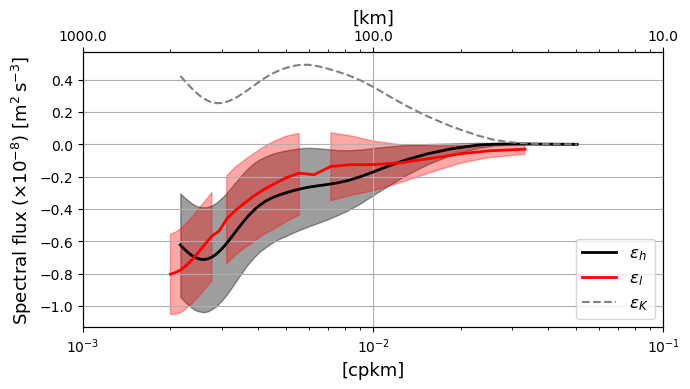

In [16]:
iZ = 1
# iiter = 1419120

     
dks = xr.DataArray(np.abs(np.diff(ds4.scale**-1)).data, dims='scale',
                       coords={'scale':.5*(ds4.scale[1:].data + ds4.scale[:-1].data)}
                      ).interp(scale=ds4.scale, kwargs={"fill_value": "extrapolate"})
    # MtE = (ds4.iso_uA + ds4.iso_vA)
SPu = ds4.iso_SPu
SPv = ds4.iso_SPv
SP = (SPu + SPv)
Ak = (dtau.iso_uA + dtav.iso_vA
      # ds0.iso_uA + ds1.iso_vA
      # - MtE
      + SP
)

pit = ((Ak * dks
       ).sum('angle').stack(zeta=("time", "nmemb")
                           ).transpose('zeta','scale'
                                      )[...,::-1
                                       ].cumsum('scale')[...,::-1].compute() 
       * np.diff(ds4.angle)[0]*2)

Ah = -(dsh.iso_uuu + dsh.iso_vuv)

piw = ((Ah * dks
       ).sum('angle').stack(zeta=("time", "nmemb")
                           ).transpose('zeta','scale'
                                      )[...,::-1
                                       ].cumsum('scale')[...,::-1].compute() 
       * np.diff(ds4.angle)[0]*2)
datas = (piw, )  # samples must be in a sequence
rng = np.random.default_rng()
Pwres = bootstrap(datas, np.mean, confidence_level=0.95,
                      # n_resamples=100,
                      random_state=rng)

piA = (dsf.Pi.stack(zeta=("time", "nmemb")
                   ).transpose('zeta','scale').compute() 
       * np.diff(ds4.angle)[0]*2)
datas = (piA, )  # samples must be in a sequence
rng = np.random.default_rng()
PAres = bootstrap(datas, np.mean, confidence_level=0.95,
                      # n_resamples=100,
                      random_state=rng)
    
    
fig, ax = plt.subplots(figsize=(7,4))
fig.set_tight_layout(True)
    # ax2 = ax.twinx()
ax3 = ax.twiny()
    
ax.fill_between((ds4.scale)**-1*1e3, Pwres.confidence_interval.low*1e8, 
                Pwres.confidence_interval.high*1e8, 
                alpha=.38, color='k')
ax.fill_between((dsf.scale*2)**-1*1e3, PAres.confidence_interval.low*1e8, 
                PAres.confidence_interval.high*1e8, 
                alpha=.34, color='r')

ax.plot((ds4.scale)**-1*1e3, piw.mean(['zeta'])*1e8,
            'k', lw=2, label=r"$\varepsilon_h$")
ax.plot((dsf.scale*2)**-1*1e3, piA.mean(['zeta'])*1e8,
            'r', lw=2, label=r"$\varepsilon_l$")
ax.plot((ds4.scale)**-1*1e3, pit.mean(['zeta'])*1e8,
            c='grey', ls='--', label=r"$\varepsilon_K$")
    
ax.set_xscale('log')
ax3.set_xscale('log')
ax.set_xlim([1e-3,1e-1])

ax3.set_xlim([1e-3,1e-1])
ax3.set_xticks([1e-3,1e-2,1e-1])
ax3.set_xticklabels([1e3,1e2,1e1])
ax.set_xlabel(r"[cpkm]", fontsize=13)
ax3.set_xlabel(r"[km]", fontsize=13)

ax.legend(loc='lower right', fontsize=12)

ax.set_ylabel(r"Spectral flux ($\times 10^{-8}$) [m$^2\,$s$^{-3}$]", 
              fontsize=13)

ax.grid(True)
plt.savefig(op.join(spec,'Figs/WKE-horspecflux_diag_Region%02d_Z452_1967.pdf' % reg))
plt.show()